In [1]:
from __future__ import print_function, division
import mdtraj as md
from mdtraj.utils import ensure_type
from mdtraj.geometry import compute_distances, compute_angles
from mdtraj.geometry import _geometry
import os
import sys
import numpy as np
import scipy as sp
from scipy import optimize
from scipy.optimize import leastsq
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import math
import itertools    
from numpy import log2, zeros, mean, var, sum, loadtxt, arange, array, cumsum, dot, transpose, diagonal, floor
from numpy.linalg import inv, lstsq
import pyblock
from mdtraj.geometry import _geometry
from mdtraj.utils import ensure_type
from mdtraj.geometry import compute_distances, compute_angles
from scipy.stats import pearsonr
import json

class NpEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

/Users/f006j60/miniconda3/envs/labconda/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
def subplot_snsheat(data, ax=None, cbar=False, cbar_ax=None):
    from numpy import ndarray
    import seaborn as sns
    if type(data) is ndarray:

        if ax is None:
            ax = plt.gca()

        plot = sns.heatmap(data, cmap='jet', vmin=0,vmax=0.5,ax=ax, cbar=cbar, cbar_ax=None if not cbar else cbar_ax)
        return plot

    else: pass
    
def subplot_imshow(data, xedges, yedges, ax=None):
    
    from numpy import ndarray
    
    if type(data) is ndarray:

        if ax is None:
            ax = plt.gca()
            
        im = ax.imshow(data, interpolation='gaussian', extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],
                        cmap='jet', aspect='auto', vmin =0.01, vmax=5.0)
        # cbar_ticks = [0, 1, 2, 3, 4, 5]
        # cb = plt.colorbar(ticks=cbar_ticks, format=('% .1f'),aspect=10)
        
        return im
    
    else : pass

In [3]:
data_dir_a='./outdir_yxi1_iapp_analysis_3us/'

In [4]:
# Anton trajectory
# hbond_a={}
# charge_a={}
# aro_a={}
# hphob_a={}

# contact_a=np.loadtxt(data_dir_a+'contact_prob.dat')

# hbond_a['all']=np.loadtxt(data_dir_a+'hbond_fraction.be.dat')
# charge_a['all']=np.loadtxt(data_dir_a+'charge_contacts.dat')
# aro_a['all']=np.loadtxt(data_dir_a+'aromatic_stacking.fraction.r0.be.dat')
# hphob_a['all']=np.loadtxt(data_dir_a+'hphob_contacts.be.dat')

# kd_errors_a=np.loadtxt(data_dir_a+'KD.timecourse.errors.dat')

# hbond_a['bf']=np.loadtxt(data_dir_a+'hbond_fraction.boundfraction.be.dat')
# charge_a['bf']=np.loadtxt(data_dir_a+'charge_contacts.BF.dat')
# aro_a['bf']=np.loadtxt(data_dir_a+'aromatic_stacking.boundfraction.r0.be.dat')
# hphob_a['bf']=np.loadtxt(data_dir_a+'hphob_contacts.BF.dat')

In [5]:
replica0,nrep=0,20

# IAPP sequence 
sequence=  ['LYS1', 'CYS2', 'ASN3', 'THR4', 'ALA5', 'THR6', 'CYS7', 'ALA8', 'THR9', 'GLN10', 'ARG11', 'LEU12', 'ALA13', 'ASN14', 'PHE15', 'LEU16', 'VAL17', 'HIS18', 'SER19', 'GLY20', 'ASN21', 'ASN22', 'PHE23', 'GLY24', 'ALA25', 'ILE26', 'LEU27', 'SER28', 'SER29', 'THR30', 'ASN31', 'VAL32', 'GLY33', 'SER34', 'ASN35', 'THR36', 'TYR37', 'NH238', 'LIG39']


temperature = [300.0, 308.18, 316.57, 325.2, 334.06, 343.16, 352.52, 362.12, 371.99, 382.13, 392.54, 403.24, 414.22, 425.51, 437.11, 449.02, 461.26, 473.82, 486.74, 500.0]



In [6]:
for n,i in enumerate(sequence): 
    if n%2 == 0: 
        sequence[n] = ""
sequence

['',
 'CYS2',
 '',
 'THR4',
 '',
 'THR6',
 '',
 'ALA8',
 '',
 'GLN10',
 '',
 'LEU12',
 '',
 'ASN14',
 '',
 'LEU16',
 '',
 'HIS18',
 '',
 'GLY20',
 '',
 'ASN22',
 '',
 'GLY24',
 '',
 'ILE26',
 '',
 'SER28',
 '',
 'THR30',
 '',
 'VAL32',
 '',
 'SER34',
 '',
 'THR36',
 '',
 'NH238',
 '']

In [7]:
data_dir='./outdir_yxi1_iapp_analysis_3us/'

In [8]:
contact_map_p=json.load(open(data_dir+'p_contact_map.json','r'))

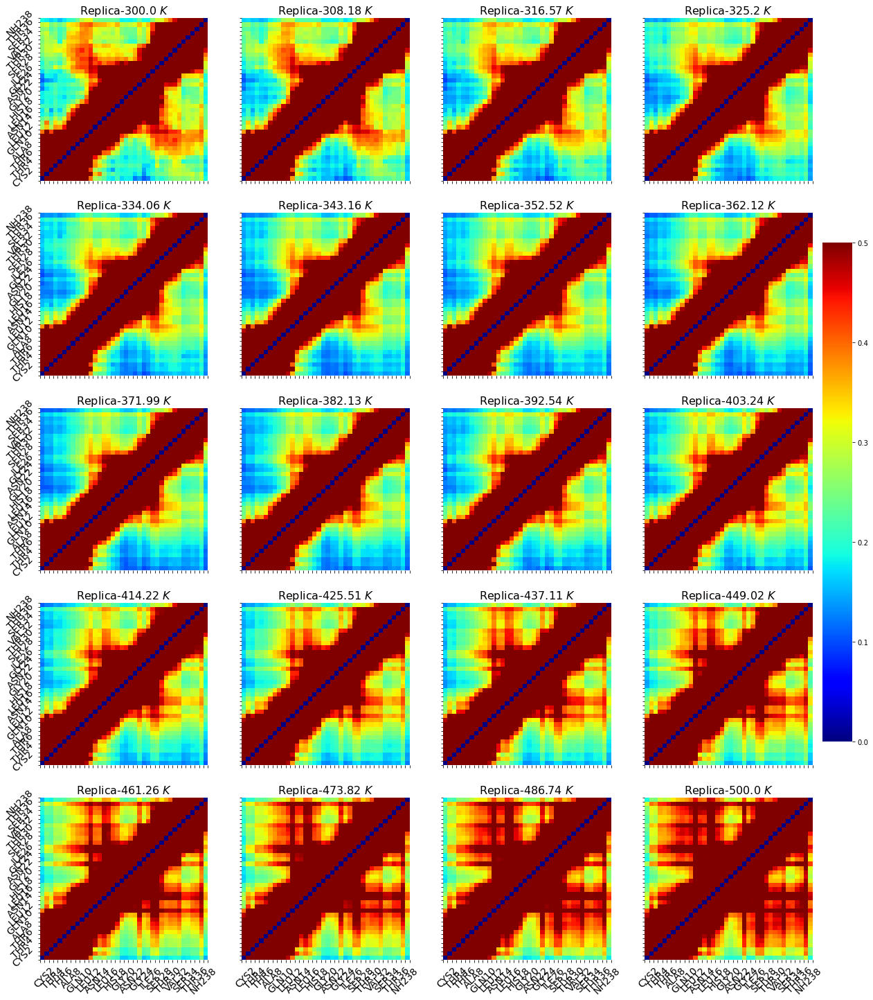

In [9]:
ncol = 4
nrow = int(nrep/ncol)
fig, ax = plt.subplots(nrow, ncol, sharex=True, sharey=True, figsize=(20, 25))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for i in range(replica0,replica0+nrep):
    #contact_map = np.loadtxt(f"./Analysis/contact_map.{i}.dat")
    contact_map = np.array(contact_map_p['rep'])[i]
    p, q = np.unravel_index(i,(nrow,ncol))
    cb = i==1
    subplot_snsheat(contact_map, ax=ax[p,q], cbar=cb, cbar_ax=cbar_ax)
    ax[p,q].set_xticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].set_yticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].invert_yaxis()
    ax[p,q].set_title('Replica-'+str(temperature[i])+r' $K$',size=16)
    
plt.savefig(data_dir+'p_contact_maps_rep.png',dpi=310)

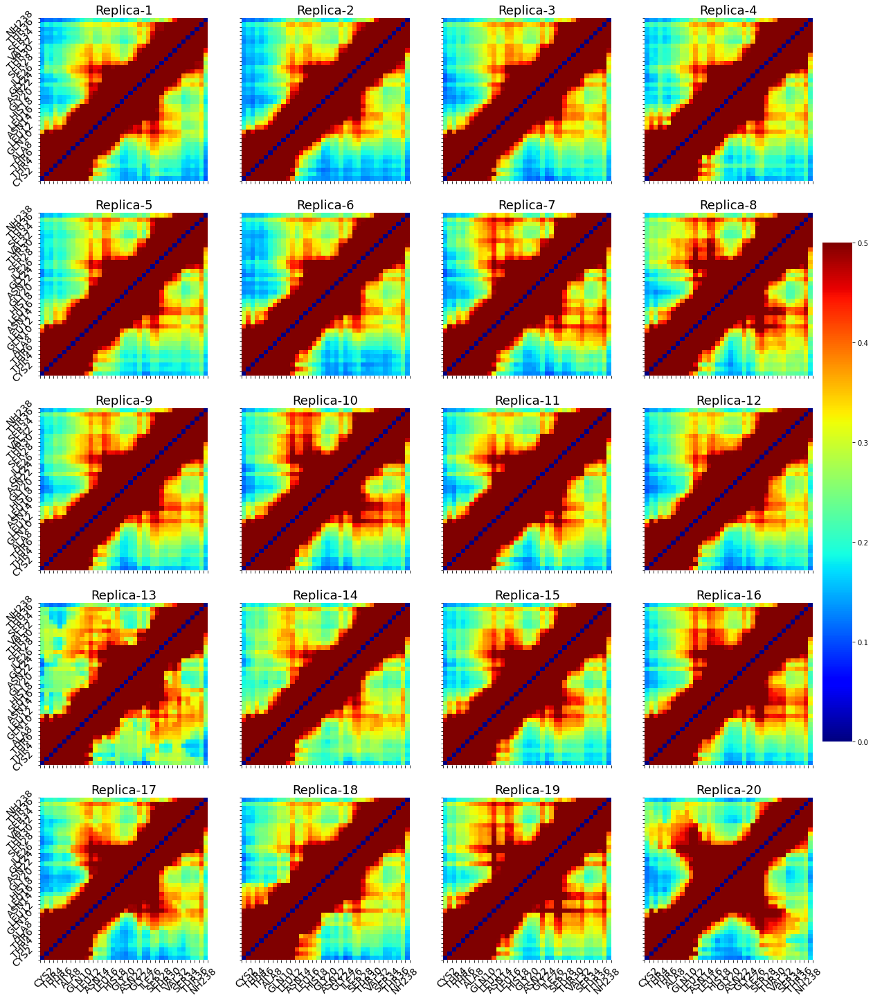

In [10]:
ncol = 4
nrow = int(nrep/ncol)
fig, ax = plt.subplots(nrow, ncol, sharex=True, sharey=True, figsize=(20, 25))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for i in range(replica0,replica0+nrep):
    #contact_map = np.loadtxt(f"./Analysis/contact_map.{i}.dat")
    contact_map = np.array(contact_map_p['demux'])[i]
    p, q = np.unravel_index(i,(nrow,ncol))
    cb = i==1
    subplot_snsheat(contact_map, ax=ax[p,q], cbar=cb, cbar_ax=cbar_ax)
    ax[p,q].set_xticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].set_yticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].invert_yaxis()
    ax[p,q].set_title('Replica-'+str(i+1),size=18)
    
plt.savefig(data_dir+'p_contact_maps_demux.png',dpi=310)

In [11]:
contact_map_l=json.load(open(data_dir+'l_contact_map.json','r'))

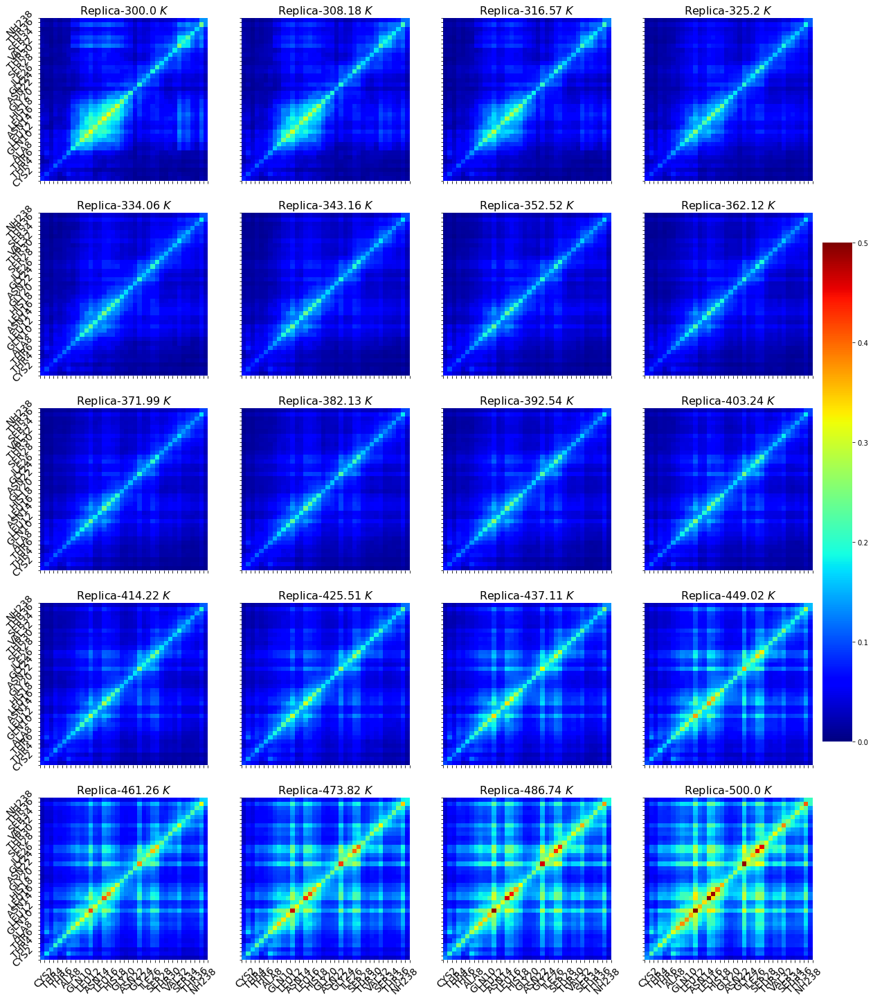

In [12]:
ncol = 4
nrow = int(nrep/ncol)
fig, ax = plt.subplots(nrow, ncol, sharex=True, sharey=True, figsize=(20, 25))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for i in range(replica0,replica0+nrep):
    #contact_map = np.loadtxt(f"./Analysis/contact_map.{i}.dat")
    contact_map = np.array(contact_map_l['rep'])[i]
    p, q = np.unravel_index(i,(nrow,ncol))
    cb = i==1
    subplot_snsheat(contact_map, ax=ax[p,q], cbar=cb, cbar_ax=cbar_ax)
    ax[p,q].set_xticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].set_yticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].invert_yaxis()
    ax[p,q].set_title('Replica-'+str(temperature[i])+r' $K$',size=16)
    
plt.savefig(data_dir+'l_contact_maps_rep.png',dpi=310)

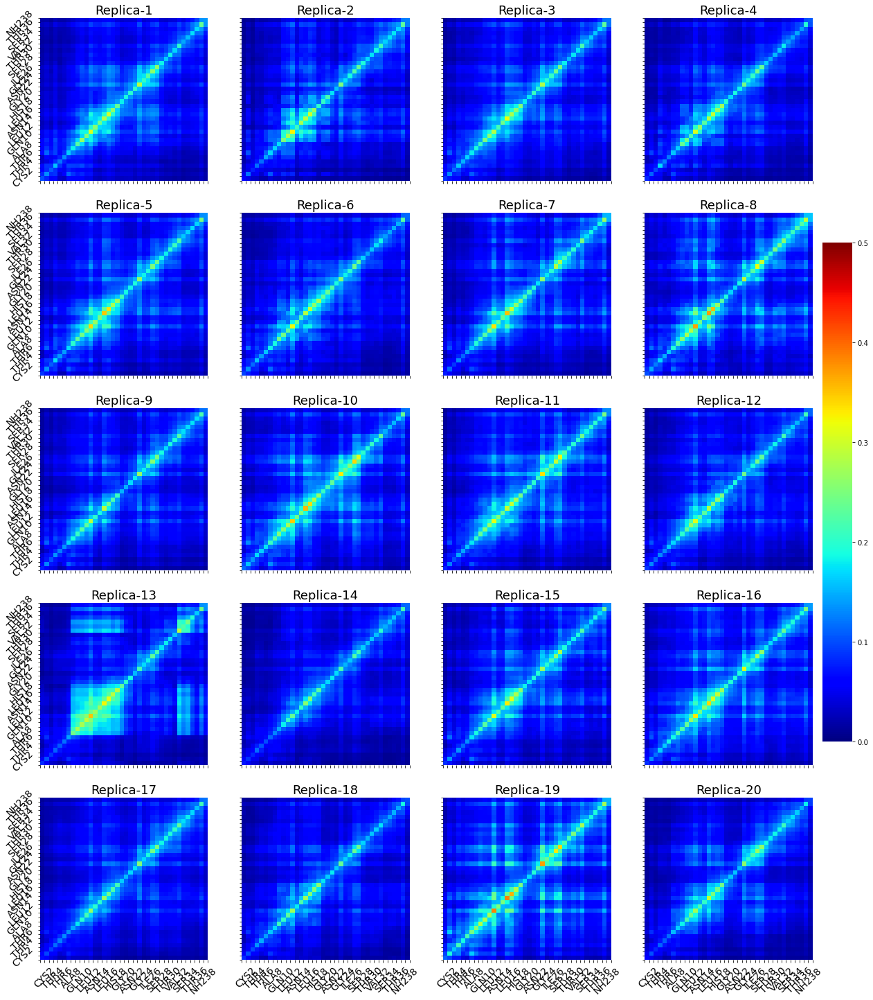

In [13]:
ncol = 4
nrow = int(nrep/ncol)
fig, ax = plt.subplots(nrow, ncol, sharex=True, sharey=True, figsize=(20, 25))
cbar_ax = fig.add_axes([.91, .3, .03, .4])

for i in range(replica0,replica0+nrep):
    #contact_map = np.loadtxt(f"./Analysis/contact_map.{i}.dat")
    contact_map = np.array(contact_map_l['demux'])[i]
    p, q = np.unravel_index(i,(nrow,ncol))
    cb = i==1
    subplot_snsheat(contact_map, ax=ax[p,q], cbar=cb, cbar_ax=cbar_ax)
    ax[p,q].set_xticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].set_yticks(range(0, 39), sequence, rotation=45, size=14)
    ax[p,q].invert_yaxis()
    ax[p,q].set_title('Replica-'+str(i+1),size=18)
    
plt.savefig(data_dir+'l_contact_maps_demux.png',dpi=310)

In [14]:
bf_kd=json.load(open(data_dir+'bf_kd.json','r'))

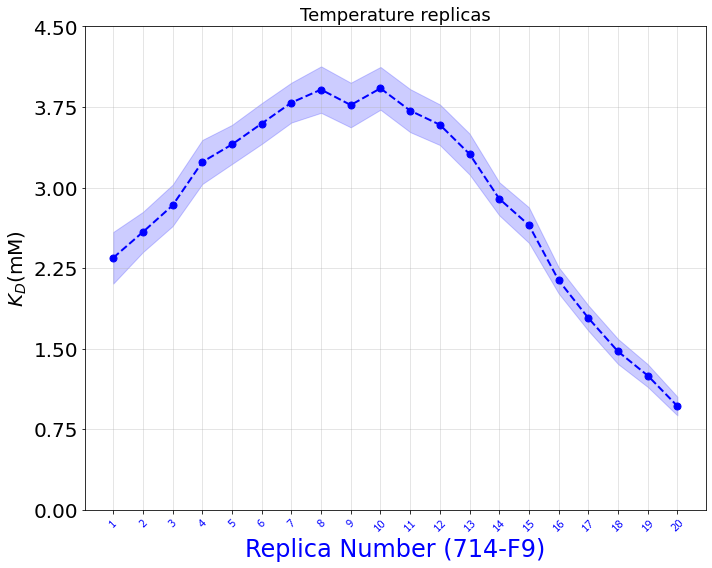

In [15]:
fig=plt.figure(figsize=(10,8))

#default_x_ticks=range(nrep)
plt.xticks(range(0,nrep+1),fontsize=20, rotation=45, font='Verdana',color='b')
#ax1.set_xticklabels(kd41[:,0])
plt.xlabel('Replica Number (714-F9)', fontsize=24,color='b')
plt.plot(range(1,nrep+1),np.array(bf_kd['rep'])[2],linestyle='--', marker='o', color='b', lw=2, ms=7)
plt.fill_between(range(1,nrep+1), np.array(bf_kd['rep'])[2]-np.array(bf_kd['rep'])[3],
                 np.array(bf_kd['rep'])[2]+np.array(bf_kd['rep'])[3], color='b', alpha=0.2)

plt.yticks(np.arange(0,5,0.75),size=20)
plt.grid(alpha=0.4)
yl=r'$K_{D}$(mM)'
plt.ylabel(yl,size=20)
plt.title("Temperature replicas",size=18)
plt.tight_layout()

plt.savefig(data_dir+'kd_rep.png',dpi=210)

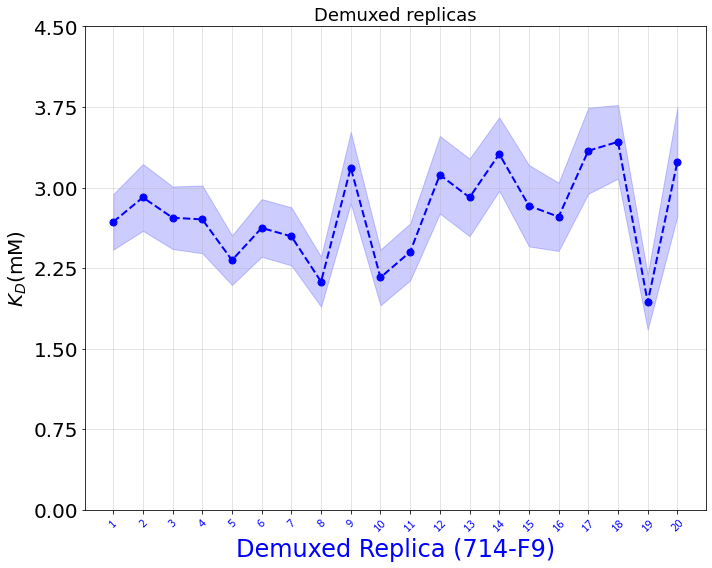

In [16]:
fig=plt.figure(figsize=(10,8))

#default_x_ticks=range(nrep)
plt.xticks(range(0,nrep+1),fontsize=20, rotation=45, font='Verdana',color='b')
#ax1.set_xticklabels(kd41[:,0])
plt.xlabel('Demuxed Replica (714-F9)', fontsize=24,color='b')
plt.plot(range(1,nrep+1),np.array(bf_kd['demux'])[2],linestyle='--', marker='o', color='b', lw=2, ms=7)
plt.fill_between(range(1,nrep+1), np.array(bf_kd['demux'])[2]-np.array(bf_kd['demux'])[3],
                 np.array(bf_kd['demux'])[2]+np.array(bf_kd['demux'])[3], color='b', alpha=0.2)

plt.yticks(np.arange(0,5,0.75),size=20)
plt.grid(alpha=0.4)
yl=r'$K_{D}$(mM)'
plt.ylabel(yl,size=20)
plt.title("Demuxed replicas",size=18)
plt.tight_layout()

plt.savefig(data_dir+'kd_demux.png',dpi=210)

In [17]:
ss=json.load(open(data_dir+'ss_fraction.json','r'))
sa=json.load(open(data_dir+'sa_timeseries.json','r'))
# pp=json.load(open(data_dir+'pp_timeseries.json','r'))
rg=json.load(open(data_dir+'rg_timeseries.json','r'))

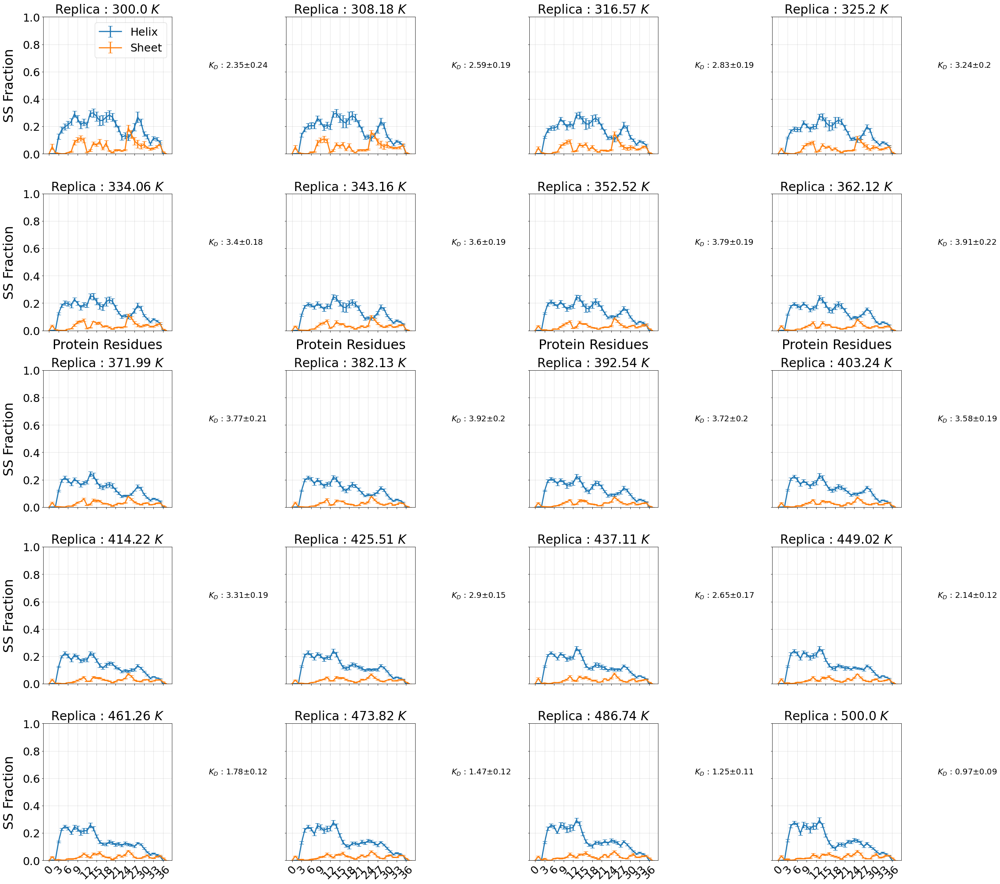

In [18]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

for val in range(nrep):
    p, q = np.unravel_index(val,(5, 4))
    ax[p,q].errorbar(range(0, 38),np.array(ss['rep']['helix'])[val].T[0],
                     yerr=np.array(ss['rep']['helix'])[val].T[1], capsize=5,label='Helix',linewidth=2.5)
    ax[p,q].errorbar(range(0, 38),np.array(ss['rep']['sheet'])[val].T[0],
                     yerr=np.array(ss['rep']['sheet'])[val].T[1], capsize=5,label='Sheet',linewidth=2.5)
    
    ax[p,q].tick_params(labelsize=25)
    ax[p,q].grid(alpha=0.4)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    ax[p,q].set_ylim(0,1.0)
    ax[p,q].set_xticks(range(0,38,3))
    ax[p,q].set_title('Replica : '+str(temperature[val])+' $K$',size=28)
    
    if val == 0:
        ax[p,q].legend(loc=1,prop={'size': 25})
    
    if not q : ax[p,q].set_ylabel("SS Fraction", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Protein Residues', size=30, labelpad=15)
    
    text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
    ax[p,q].text(50.3, 0.63, text_, fontsize = 18)
    
plt.tight_layout()
plt.savefig(data_dir+'ss_fraction_rep.png',dpi=210)

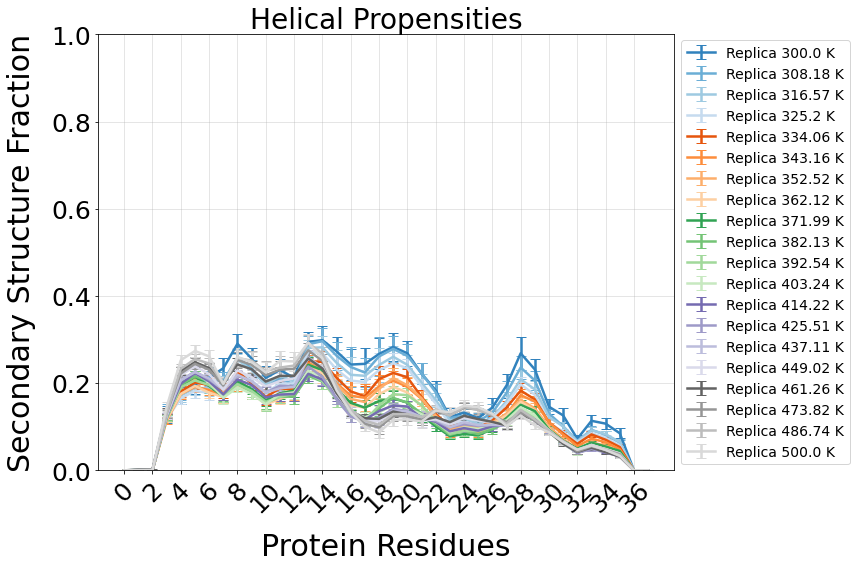

In [19]:
plt.figure(figsize=(12,8))

for val in range(20):
    
    plt.errorbar(range(0, 38),np.array(ss['rep']['helix'])[val].T[0],yerr=np.array(ss['rep']['helix'])[val].T[1],
                 capsize=5,label='Replica '+str(temperature[val])+' K',linewidth=2.5,c=plt.cm.tab20c(val))
    
    
plt.tick_params(labelsize=25)
plt.grid(alpha=0.4)
plt.ylim(0,1.0)
plt.xticks(range(0,38,2),rotation=45)
plt.title('Helical Propensities',size=28)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14) 
plt.ylabel("Secondary Structure Fraction", size=30, labelpad=15)
plt.xlabel('Protein Residues', size=30, labelpad=15)
    
#     text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
#     ax[p,q].text(120.3, 0.63, text_, fontsize = 28)
    
plt.tight_layout()
plt.savefig(data_dir+'ss_fraction_helix_rep.png',dpi=210)

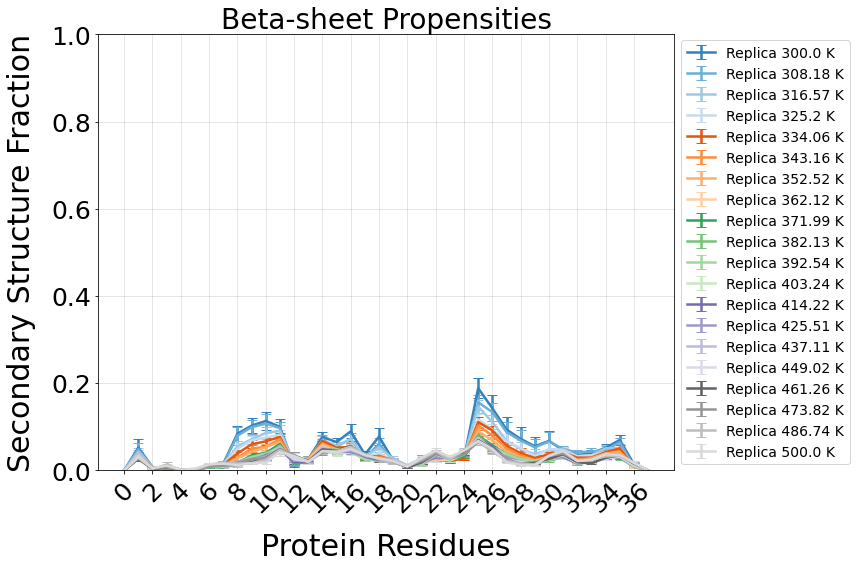

In [20]:
plt.figure(figsize=(12,8))

for val in range(20):
    
    plt.errorbar(range(0,38),np.array(ss['rep']['sheet'])[val].T[0],yerr=np.array(ss['rep']['sheet'])[val].T[1],
                 capsize=5,label='Replica '+str(temperature[val])+' K',linewidth=2.5,c=plt.cm.tab20c(val))
    
plt.tick_params(labelsize=25)
plt.grid(alpha=0.4)
plt.ylim(0,1.0)
plt.xticks(range(0,38,2),rotation=45)
plt.title('Beta-sheet Propensities',size=28)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14) 
plt.ylabel("Secondary Structure Fraction", size=30, labelpad=15)
plt.xlabel('Protein Residues', size=30, labelpad=15)

    
plt.tight_layout()
plt.savefig(data_dir+'ss_fraction_sheet_rep.png',dpi=210)

(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)
(38,) (38,)


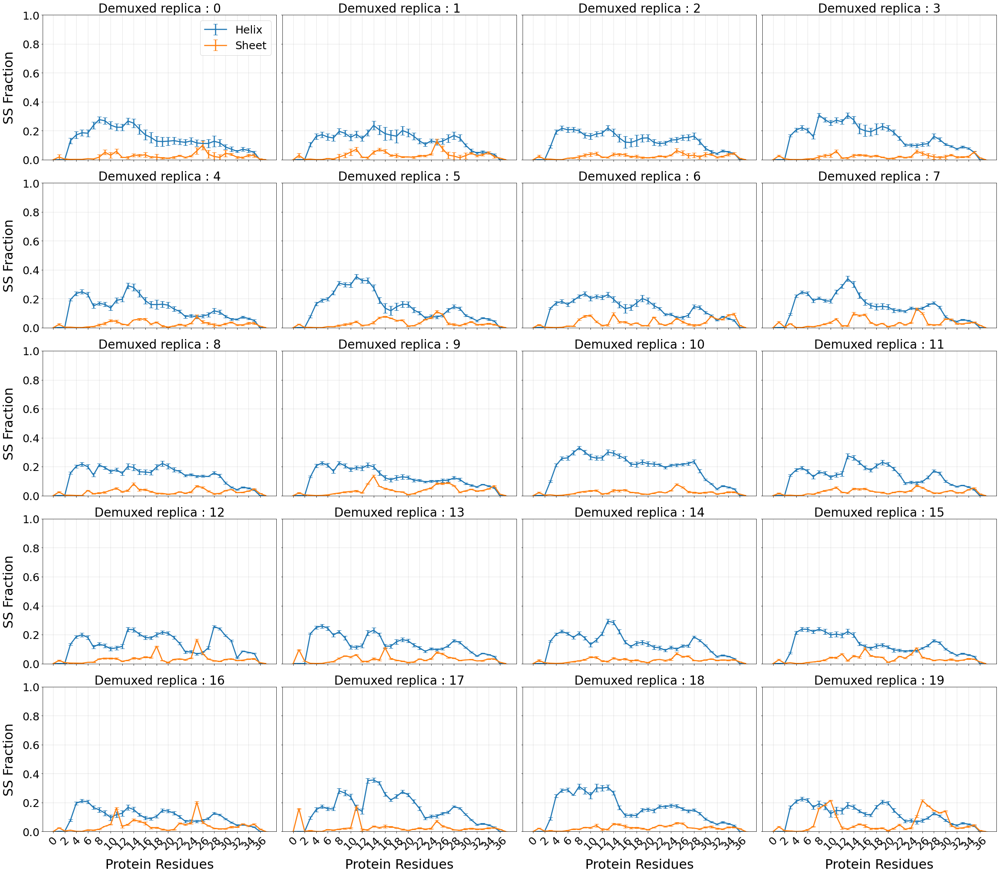

In [21]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))

    print(np.array(ss['demux']['helix'])[val].T[0].shape, np.array(ss['rep']['helix'])[val].T[1].shape)
    
    ax[p,q].errorbar(range(0,38),np.array(ss['demux']['helix'])[val].T[0],
                     yerr=np.array(ss['rep']['helix'])[val].T[1], capsize=5,label='Helix',linewidth=2.5)
    ax[p,q].errorbar(range(0,38),np.array(ss['demux']['sheet'])[val].T[0],
                     yerr=np.array(ss['rep']['sheet'])[val].T[1], capsize=5,label='Sheet',linewidth=2.5)
    
    ax[p,q].tick_params(labelsize=25)
    ax[p,q].grid(alpha=0.4)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    ax[p,q].set_ylim(0,1.0)
    ax[p,q].set_xticks(range(0,38,2))
    ax[p,q].set_title('Demuxed replica : '+str(val),size=28)
    
    if val == 0:
        ax[p,q].legend(loc=1,prop={'size': 25})
    
    if not q : ax[p,q].set_ylabel("SS Fraction", size=30, labelpad=15)
    if p == 5-1 : ax[p,q].set_xlabel('Protein Residues', size=30, labelpad=15)
    
#     text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
#     ax[p,q].text(120.3, 0.63, text_, fontsize = 28)
    
plt.tight_layout()

plt.savefig(data_dir+'ss_fraction_demux.png',dpi=210)

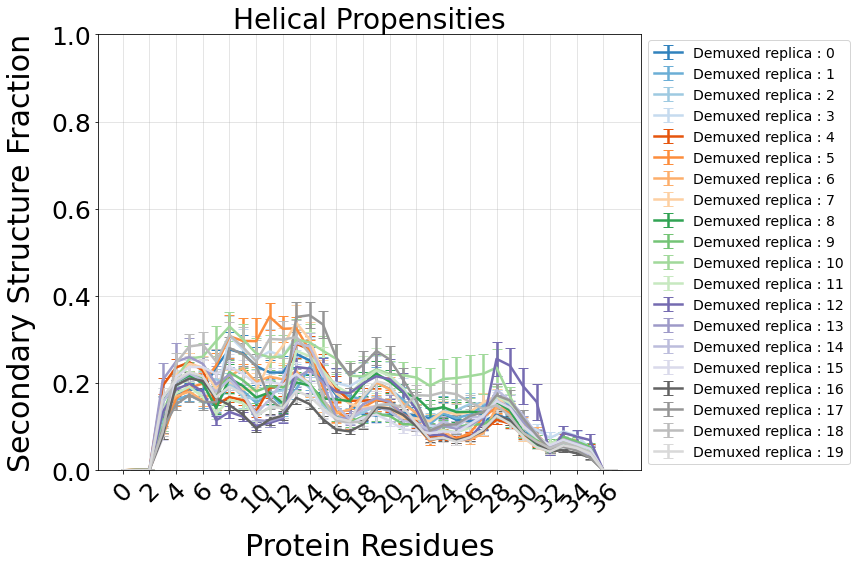

In [22]:
plt.figure(figsize=(12,8))

for val in range(20):
    
    plt.errorbar(range(0, 38),np.array(ss['demux']['helix'])[val].T[0],yerr=np.array(ss['demux']['helix'])[val].T[1],
                 capsize=5,label='Demuxed replica : '+str(val),linewidth=2.5,c=plt.cm.tab20c(val))
    
    
plt.tick_params(labelsize=25)
plt.grid(alpha=0.4)
plt.ylim(0,1.0)
plt.xticks(range(0,38,2),rotation=45)
plt.title('Helical Propensities',size=28)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14) 
plt.ylabel("Secondary Structure Fraction", size=30, labelpad=15)
plt.xlabel('Protein Residues', size=30, labelpad=15)
    
#     text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
#     ax[p,q].text(120.3, 0.63, text_, fontsize = 28)
    
plt.tight_layout()
plt.savefig(data_dir+'ss_fraction_helix_demux.png',dpi=210)

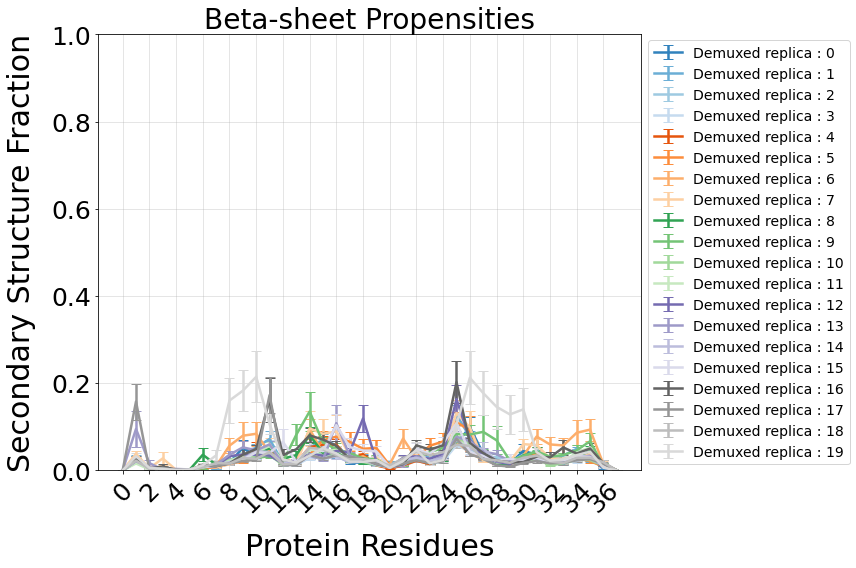

In [23]:
plt.figure(figsize=(12,8))

for val in range(20):
    
    plt.errorbar(range(0,38),np.array(ss['demux']['sheet'])[val].T[0],yerr=np.array(ss['demux']['sheet'])[val].T[1],
                 capsize=5,label='Demuxed replica : '+str(val),linewidth=2.5,c=plt.cm.tab20c(val))
    
plt.tick_params(labelsize=25)
plt.grid(alpha=0.4)
plt.ylim(0,1.0)
plt.xticks(range(0,38,2),rotation=45)
plt.title('Beta-sheet Propensities',size=28)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14) 
plt.ylabel("Secondary Structure Fraction", size=30, labelpad=15)
plt.xlabel('Protein Residues', size=30, labelpad=15)

    
plt.tight_layout()
plt.savefig(data_dir+'ss_fraction_sheet_demux.png',dpi=210)

In [24]:
# phipsi=json.load(open(data_dir+'phipsi.json','r'))

# phipsi_a=np.loadtxt(data_dir_a+'phipsi.dat')

In [25]:
# fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)


# for val in range(20):
#     p, q = np.unravel_index(val,(5, 4))
    
#     sns.kdeplot(data=np.array(phipsi['rep'])[val][0], label='α-Helix',ax=ax[p,q], linewidth=2,c='b')
#     sns.kdeplot(data=np.array(phipsi['rep'])[val][1], label='Beta Sheet',ax=ax[p,q], linewidth=2,c='darkorange')
#     sns.kdeplot(data=np.array(phipsi['rep'])[val][2], label='ppII',ax=ax[p,q], linewidth=2,c='g')
    
#     sns.kdeplot(data=phipsi_a.T[0], label='α-Helix (A)',ax=ax[p,q], linewidth=2, linestyle='--',c='b')
#     sns.kdeplot(data=phipsi_a.T[1], label='Beta Sheet (A)',ax=ax[p,q], linewidth=2, linestyle='--',c='darkorange')
#     sns.kdeplot(data=phipsi_a.T[2], label='ppII (A)',ax=ax[p,q], linewidth=2, linestyle='--',c='g')
    
#     ax[p, q].set_ylim(0,0.5)
#     #ax[p, q].set_xticks(range(121,142,2))
#     ax[p,q].tick_params(labelsize=25)
#     ax[p,q].grid(alpha=0.4)
#     plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    
#     if val == 0:
#         ax[p,q].legend(loc=1,prop={'size': 17},ncol=2)

#     a='Replica : '+str(temperature[val])+'K'
#     ax[p,q].set_title(a,size=28)
    
# #     text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
# #     ax[p,q].text(120.3, 0.43, text_, fontsize = 26)
    
#     if not q : ax[p,q].set_ylabel("Probability", size=30, labelpad=15)
#     if p == 2-1 : ax[p,q].set_xlabel('Alphabeta RMSD', size=30, labelpad=15)
        


        
# plt.tight_layout()

# plt.savefig(data_dir+'ss_rmsd_rep.png',dpi=210)


In [26]:
kd_time=json.load(open(data_dir+'kd_timecourse.json','r'))

In [27]:
for i in range(20): print(np.where(np.array(kd_time['rep'])[i].T[1]==np.inf)[0])

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]


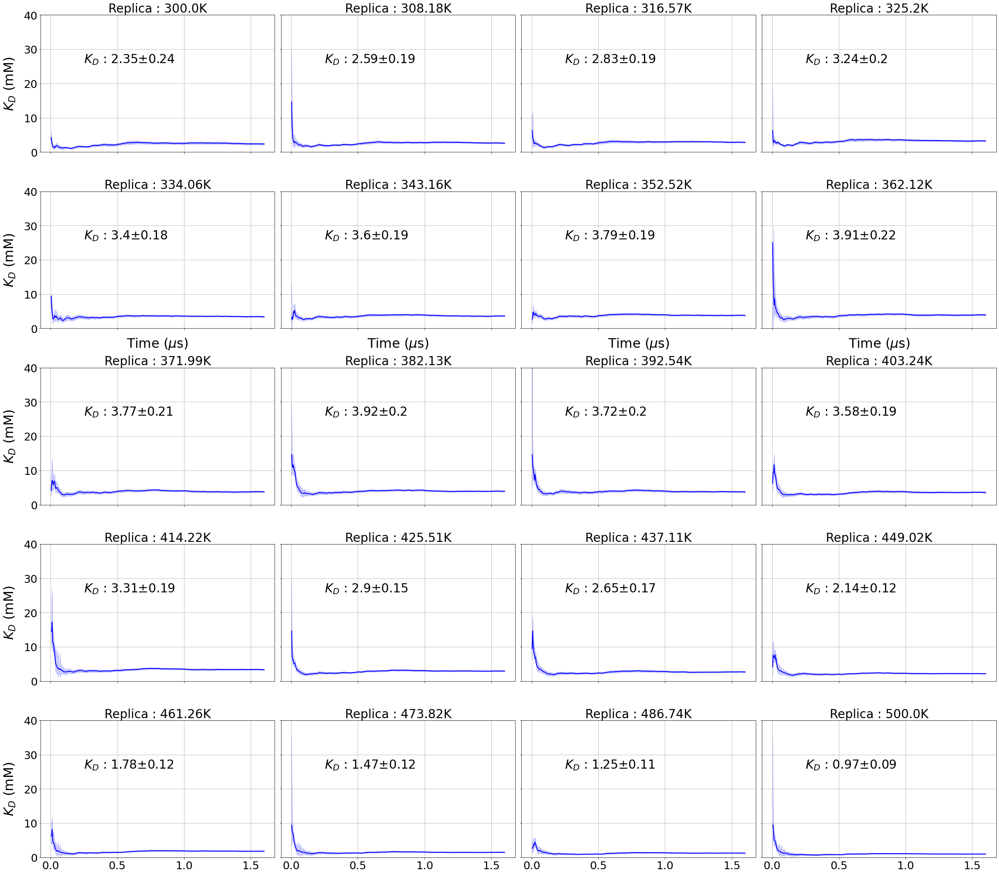

In [28]:
fig, ax = plt.subplots(5,4, figsize=(32, 28), sharex=True, sharey=True)

i='rep'

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    inf_start=len(np.where(np.array(kd_time[i])[val].T[4]==0)[0])

    ax[p,q].plot(np.array(kd_time[i])[val].T[0][inf_start::], np.array(kd_time[i])[val].T[1][inf_start::], 
                 color='blue',linewidth=2)
    ax[p,q].fill_between(np.array(kd_time[i])[val].T[0][inf_start::],np.array(kd_time[i])[val].T[2][inf_start::], 
                     np.array(kd_time[i])[val].T[3][inf_start::],color='blue', alpha=0.2)

    

    ax[p,q].grid()
    ax[p, q].set_ylim(0, 40.0)
    ax[p,q].tick_params(labelsize=25)
    #plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    
    a='Replica : '+str(temperature[val])+'K'
    ax[p,q].set_title(a,size=28)
    
    text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
    ax[p,q].text(0.25, 26, text_, fontsize = 28)
    
    if not q : ax[p,q].set_ylabel('$K_D$ (mM)', size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
    
plt.tight_layout()

plt.savefig(data_dir+'kd_timecourse.png',dpi=210)

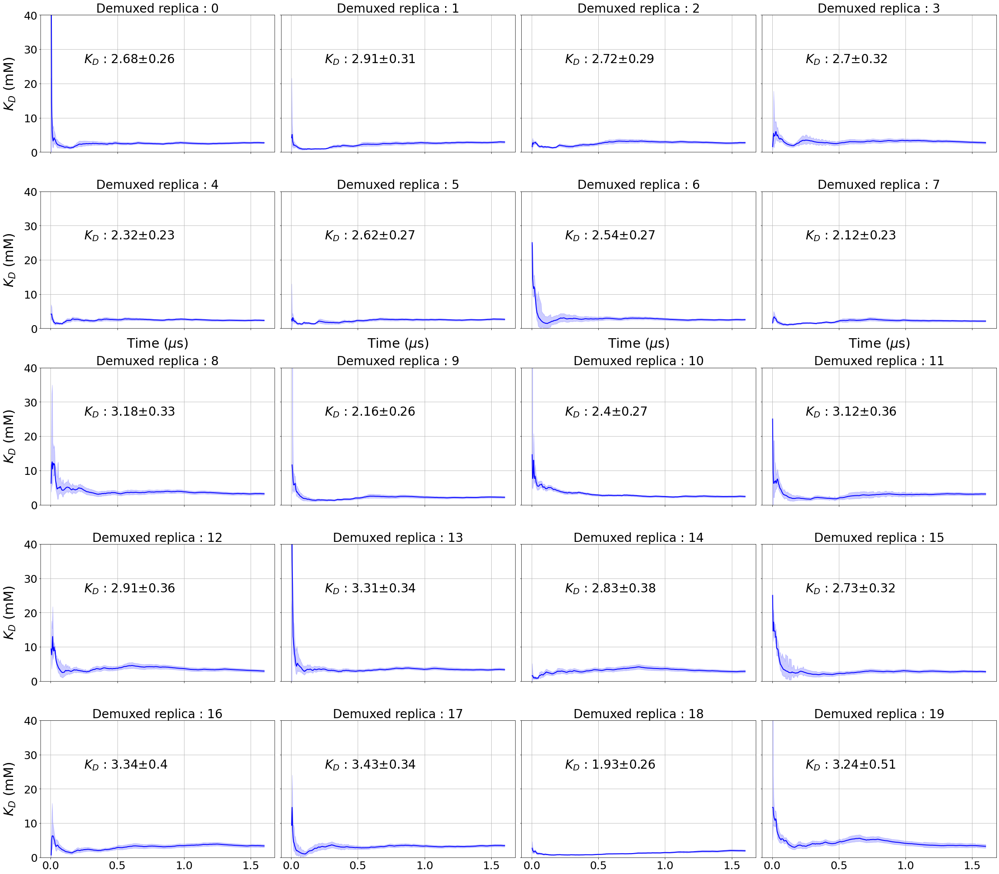

In [29]:
fig, ax = plt.subplots(5,4, figsize=(32, 28), sharex=True, sharey=True)

i='demux'

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    inf_start=len(np.where(np.array(kd_time[i])[val].T[4]==0)[0])

    ax[p,q].plot(np.array(kd_time[i])[val].T[0][inf_start::], np.array(kd_time[i])[val].T[1][inf_start::], 
                 color='blue',linewidth=2)
    ax[p,q].fill_between(np.array(kd_time[i])[val].T[0][inf_start::],np.array(kd_time[i])[val].T[2][inf_start::], 
                     np.array(kd_time[i])[val].T[3][inf_start::],color='blue', alpha=0.2)

    

    ax[p,q].grid()
    ax[p, q].set_ylim(0, 40.0)
    ax[p,q].tick_params(labelsize=25)
    #plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    
    a='Demuxed replica : '+str(val)
    ax[p,q].set_title(a,size=28)
    
    text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd[i])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd[i])[3][val],2))
    ax[p,q].text(0.25, 26, text_, fontsize = 28)
    
    if not q : ax[p,q].set_ylabel('$K_D$ (mM)', size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
    
plt.tight_layout()

plt.savefig(data_dir+'kd_timecourse_demux.png',dpi=210)

In [30]:
for i in range(nrep):
    print(np.insert(np.array(kd_time['rep'])[val].T[0],0,0.00))

time=np.insert(np.array(kd_time['rep'])[0].T[0],0,0.00)
time

[0.         0.00372093 0.00744186 0.01116279 0.01488372 0.01860465
 0.02232558 0.02604651 0.02976744 0.03348837 0.0372093  0.04093023
 0.04465116 0.04837209 0.05209302 0.05581395 0.05953488 0.06325581
 0.06697674 0.07069767 0.0744186  0.07813953 0.08186047 0.0855814
 0.08930233 0.09302326 0.09674419 0.10046512 0.10418605 0.10790698
 0.11162791 0.11534884 0.11906977 0.1227907  0.12651163 0.13023256
 0.13395349 0.13767442 0.14139535 0.14511628 0.14883721 0.15255814
 0.15627907 0.16       0.16372093 0.16744186 0.17116279 0.17488372
 0.17860465 0.18232558 0.18604651 0.18976744 0.19348837 0.1972093
 0.20093023 0.20465116 0.20837209 0.21209302 0.21581395 0.21953488
 0.22325581 0.22697674 0.23069767 0.2344186  0.23813953 0.24186047
 0.2455814  0.24930233 0.25302326 0.25674419 0.26046512 0.26418605
 0.26790698 0.27162791 0.27534884 0.27906977 0.2827907  0.28651163
 0.29023256 0.29395349 0.29767442 0.30139535 0.30511628 0.30883721
 0.31255814 0.31627907 0.32       0.32372093 0.32744186 0.331162

array([0.        , 0.00372093, 0.00744186, 0.01116279, 0.01488372,
       0.01860465, 0.02232558, 0.02604651, 0.02976744, 0.03348837,
       0.0372093 , 0.04093023, 0.04465116, 0.04837209, 0.05209302,
       0.05581395, 0.05953488, 0.06325581, 0.06697674, 0.07069767,
       0.0744186 , 0.07813953, 0.08186047, 0.0855814 , 0.08930233,
       0.09302326, 0.09674419, 0.10046512, 0.10418605, 0.10790698,
       0.11162791, 0.11534884, 0.11906977, 0.1227907 , 0.12651163,
       0.13023256, 0.13395349, 0.13767442, 0.14139535, 0.14511628,
       0.14883721, 0.15255814, 0.15627907, 0.16      , 0.16372093,
       0.16744186, 0.17116279, 0.17488372, 0.17860465, 0.18232558,
       0.18604651, 0.18976744, 0.19348837, 0.1972093 , 0.20093023,
       0.20465116, 0.20837209, 0.21209302, 0.21581395, 0.21953488,
       0.22325581, 0.22697674, 0.23069767, 0.2344186 , 0.23813953,
       0.24186047, 0.2455814 , 0.24930233, 0.25302326, 0.25674419,
       0.26046512, 0.26418605, 0.26790698, 0.27162791, 0.27534

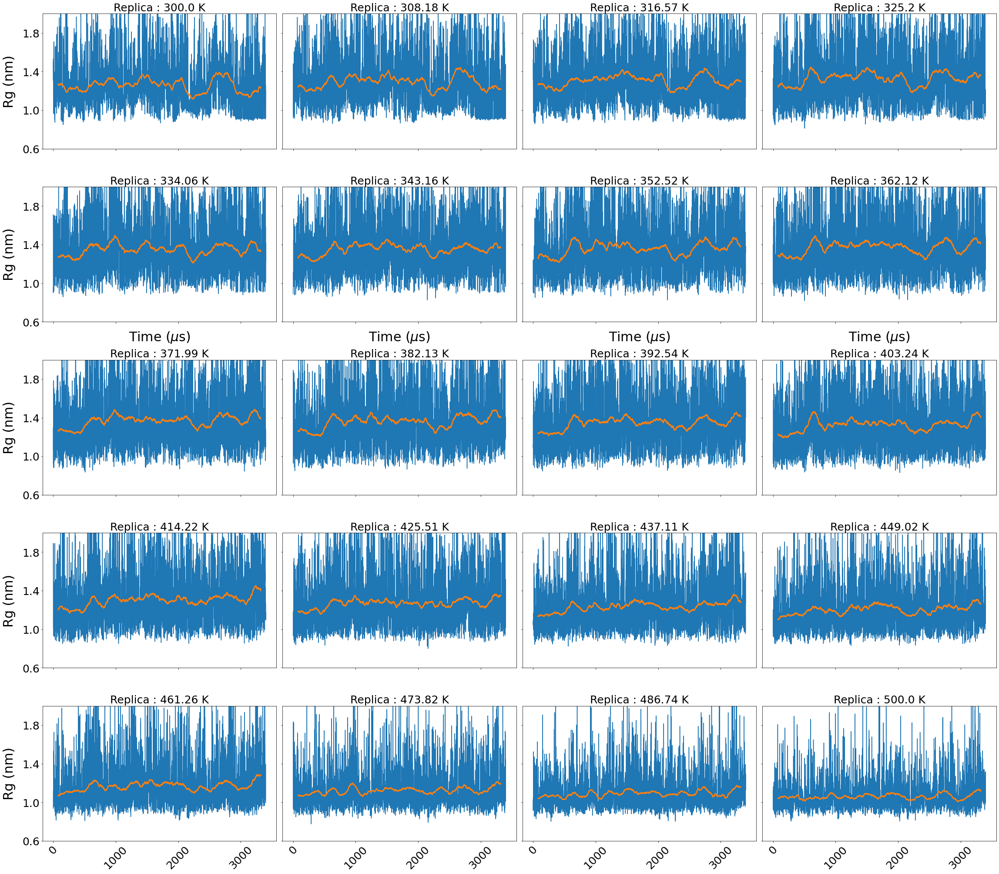

In [32]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i='rep'
N=200
time = np.linspace(0,3400,4301)
for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    ax[p,q].plot(time,np.array(rg[i])[val])
    ax[p,q].plot(np.convolve(time, np.ones(N)/N, mode='valid'),
                 np.convolve(np.array(rg[i])[val], np.ones(N)/N, mode='valid'),linewidth=2.5)
    
    ax[p,q].tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    ax[p,q].set_ylim(0.6,2.0)
    #ax[p,q].set_xticks(range(0,142,2))
    ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

    if not q : ax[p,q].set_ylabel("Rg (nm)", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_rep.png',dpi=210)

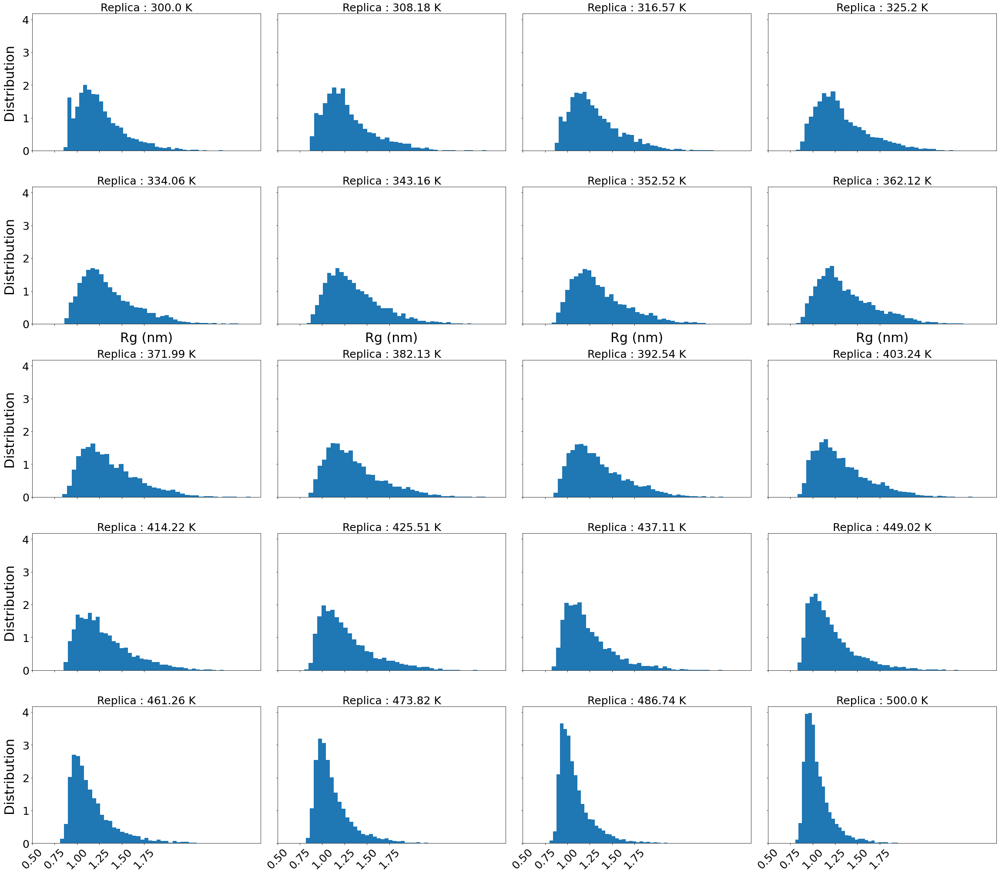

In [33]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i='rep'
N=200

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    ax[p,q].hist(np.array(rg[i])[val], bins=40, density=True)
    
    ax[p,q].tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
#    ax[p,q].set_ylim(0.6,2.0)
    ax[p,q].set_xticks(np.arange(0.5,2.0,0.25))
#    ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

    if not q : ax[p,q].set_ylabel("Distribution", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Rg (nm)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_hist_rep.png',dpi=210)

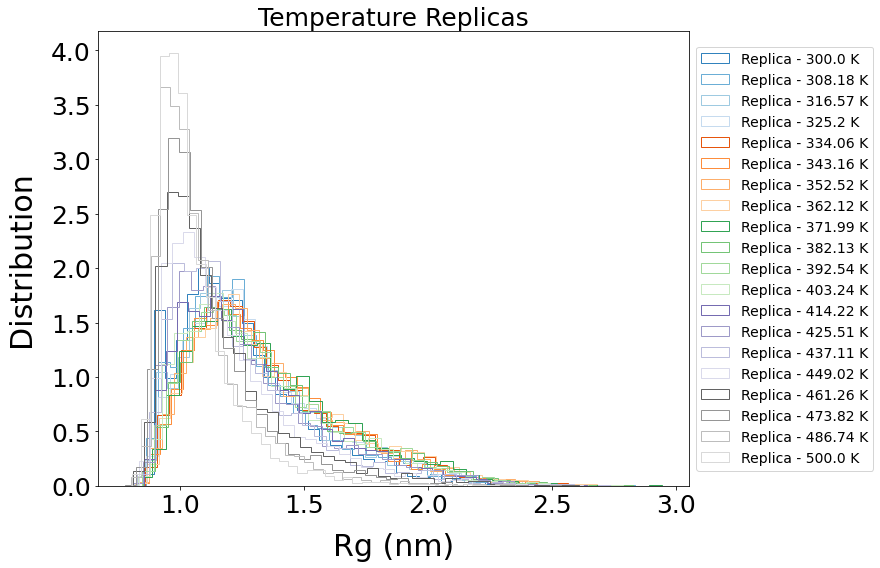

In [34]:
plt.figure(figsize=(12,8))

i='rep'

for val in range(20):
    if i=='rep': 
        label_="Replica - "+str(temperature[val])+' K'  
    else:
        label_="Demux Replica - "+str(val)
    
    plt.hist(np.array(rg[i])[val],bins=40,density=True,histtype='step',color=plt.cm.tab20c(val),label=label_)
    
    plt.tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    #ax[p,q].set_ylim(1,4)
    #ax[p,q].set_xticks(range(0,142,2))
    #ax[p,q].set_yticks(np.arange(1.0,4.0,0.4))
    
plt.title('Temperature Replicas',size=25)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
plt.ylabel("Distribution", size=30, labelpad=15)
plt.xlabel('Rg (nm)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_rep_hist_all.png',dpi=210)

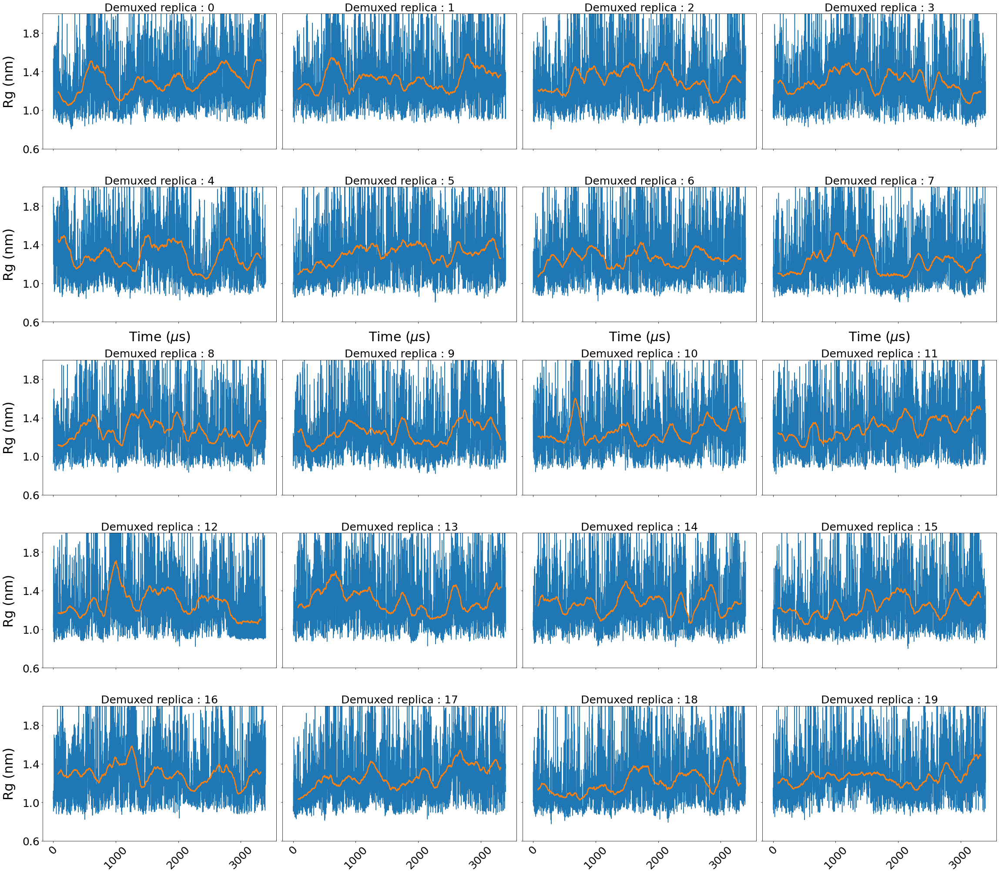

In [35]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i='demux'
N=200

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    ax[p,q].plot(time,np.array(rg[i])[val])
    ax[p,q].plot(np.convolve(time, np.ones(N)/N, mode='valid'),
                 np.convolve(np.array(rg[i])[val], np.ones(N)/N, mode='valid'),linewidth=2.5)
    
    ax[p,q].tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    ax[p,q].set_ylim(0.6,2.0)
    #ax[p,q].set_xticks(range(0,142,2))
    ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Demuxed replica : '+str(val),size=25)

    if not q : ax[p,q].set_ylabel("Rg (nm)", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_demux.png',dpi=210)

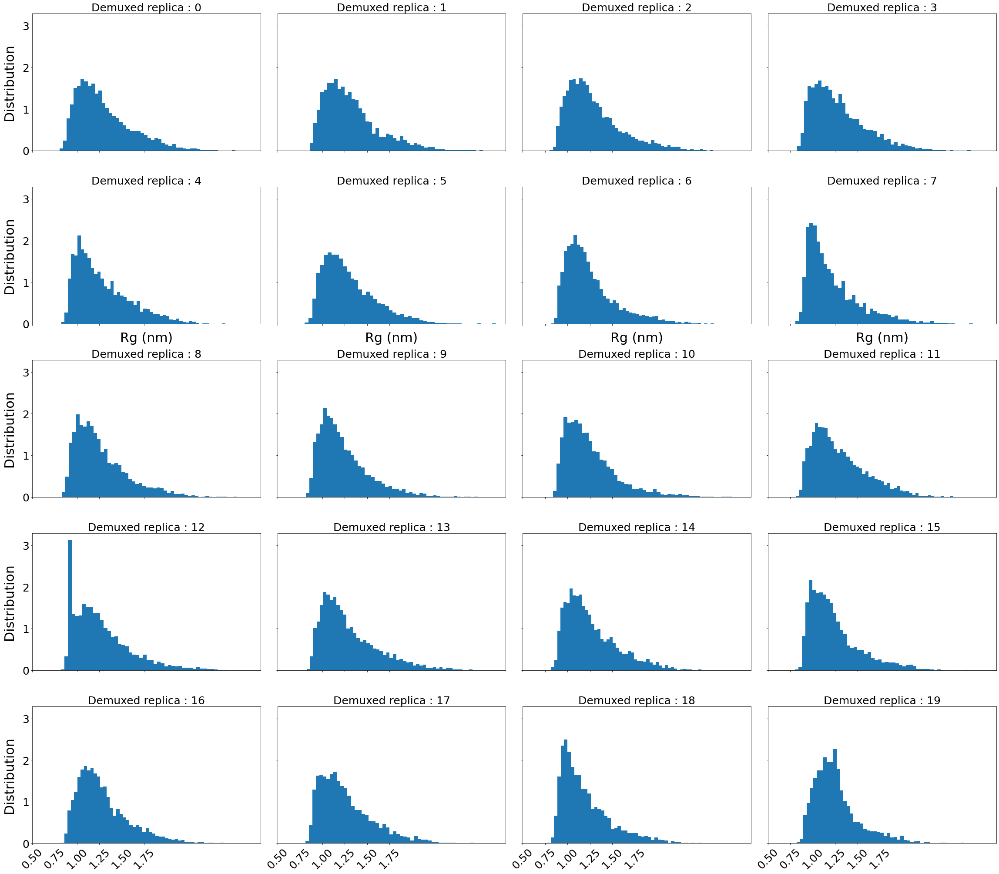

In [36]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i='demux'
N=200

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    ax[p,q].hist(np.array(rg[i])[val], bins=50, density=True)
    
    ax[p,q].tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
#    ax[p,q].set_ylim(0.6,2.0)
    ax[p,q].set_xticks(np.arange(0.5,2.0,0.25))
#    ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Demuxed replica : '+str(val),size=25)


    if not q : ax[p,q].set_ylabel("Distribution", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Rg (nm)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_hist_demux.png',dpi=210)

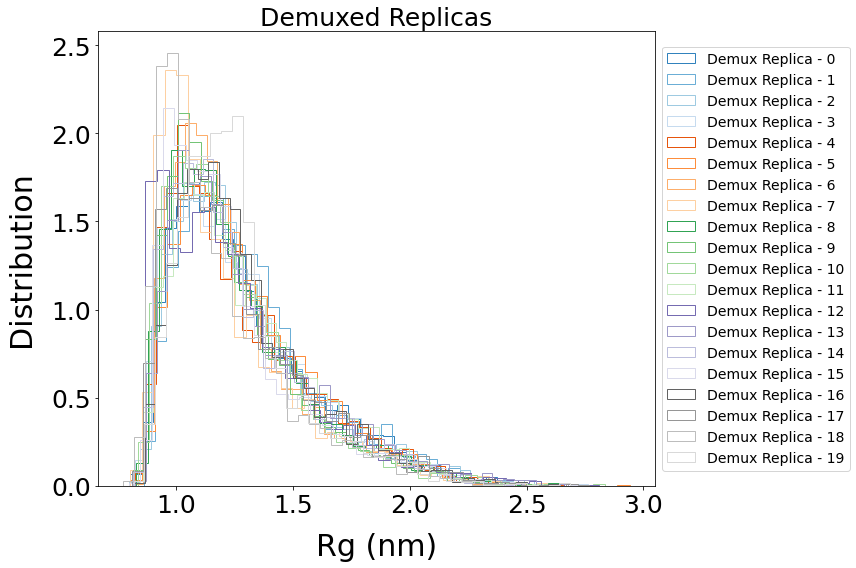

In [37]:
plt.figure(figsize=(12,8))

i='demux'

for val in range(20):
    
    if i=='rep': 
        label_="Replica - "+str(temperature[val])+' K'  
    else:
        label_="Demux Replica - "+str(val)
    
    plt.hist(np.array(rg[i])[val],bins=40,density=True,histtype='step',color=plt.cm.tab20c(val),label=label_)
    
    plt.tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    #ax[p,q].set_ylim(1,4)
    #ax[p,q].set_xticks(range(0,142,2))
    #ax[p,q].set_yticks(np.arange(1.0,4.0,0.4))
    
plt.title('Demuxed Replicas',size=25)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
plt.ylabel("Distribution", size=30, labelpad=15)
plt.xlabel('Rg (nm)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'rg_demux_hist_all.png',dpi=210)

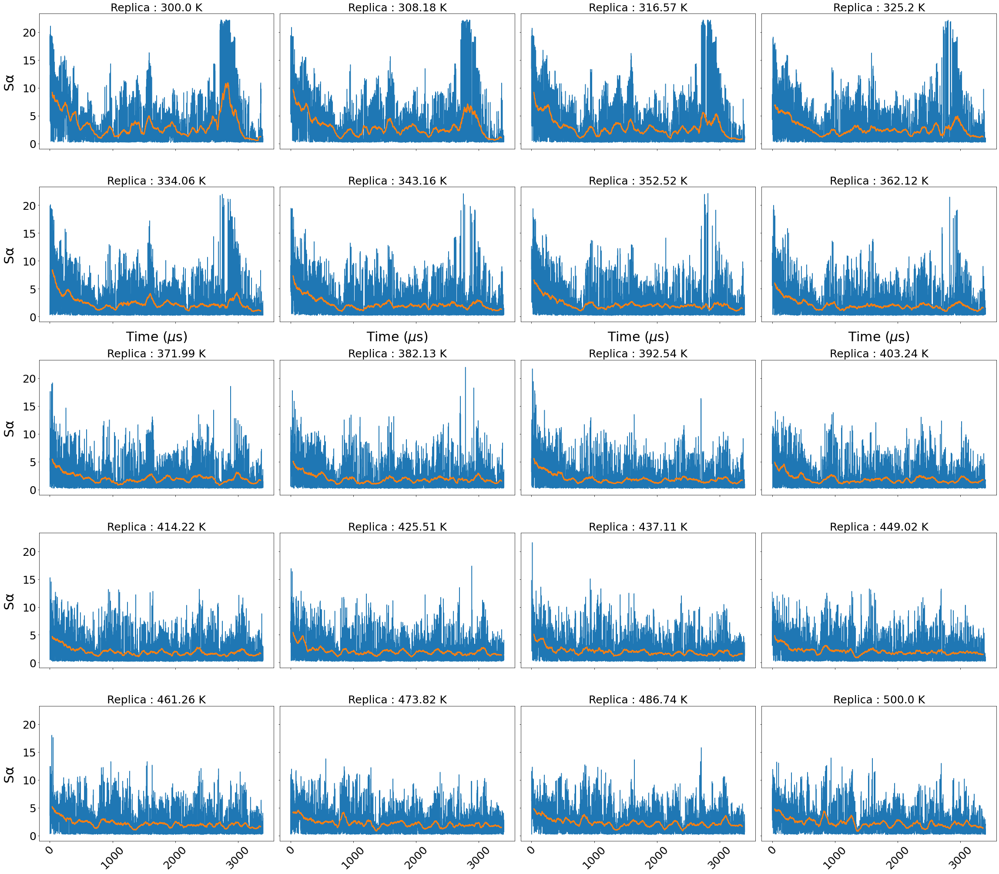

In [38]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i='rep'
N=100

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    X=np.sum(np.array(sa[i])[val],axis=0)
    
    ax[p,q].plot(time,X)
    ax[p,q].plot(np.convolve(time, np.ones(N)/N, mode='valid'),
                 np.convolve(X, np.ones(N)/N, mode='valid'),linewidth=2.5)
    
    ax[p,q].tick_params(labelsize=25)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    #ax[p,q].set_ylim(0.6,2.0)
    #ax[p,q].set_xticks(range(0,142,2))
    #ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

    if not q : ax[p,q].set_ylabel("Sα", size=30, labelpad=15)
    if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'sa_rep.png',dpi=210)

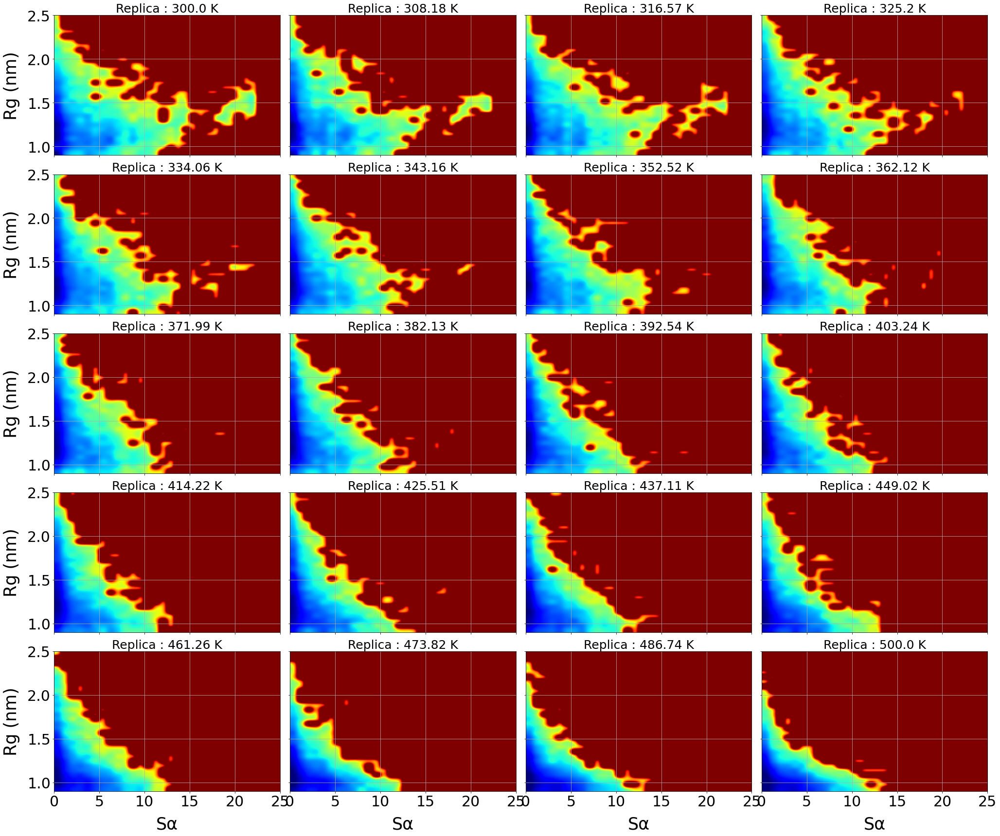

In [39]:
fig, ax = plt.subplots(5, 4, figsize=(28, 24), sharex=True, sharey=True)

i='rep'

#cbar_ax = fig.add_axes([.91, .3, .03, .4])

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    X=np.sum(np.array(sa[i])[val],axis=0)
    
    a, xedges, yedges = np.histogram2d(np.array(rg[i])[val], X, 30, [[0.9, 2.5], [0, 25.0]],
                                       normed=True, weights=None)
    
    a = np.log(np.flipud(a)+.000001)
    T = 300
    a = -(0.001987*T)*a
    

    im=subplot_imshow(a, xedges, yedges, ax=ax[p,q])
    
    
    cbar_ticks = [0, 1, 2, 3, 4, 5]
    #cb = plt.colorbar(ticks=cbar_ticks, format=('% .1f'),aspect=10,cax=cbar_ax,ax=ax[p,q])
    
    #subplot_imshow(a, xedges, yedges,ax=ax[p,q],cbar_ax=cbar_ax,cbar=cb)
    
    imaxes = plt.gca()
    
    ax[p,q].tick_params(labelsize=30)
    #plt.setp(ax[p,q].get_xticklabels())
    ax[p,q].grid()
    #ax[p,q].set_ylim(0.6,2.0)
    #ax[p,q].set_xticks(range(0,142,2))
    #ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

    if not q : ax[p,q].set_ylabel('Rg (nm)', size=35, labelpad=15)
    if p == 5-1 : ax[p,q].set_xlabel("Sα", size=35, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'sa_rg_rep.png',dpi=210)
#plt.show()

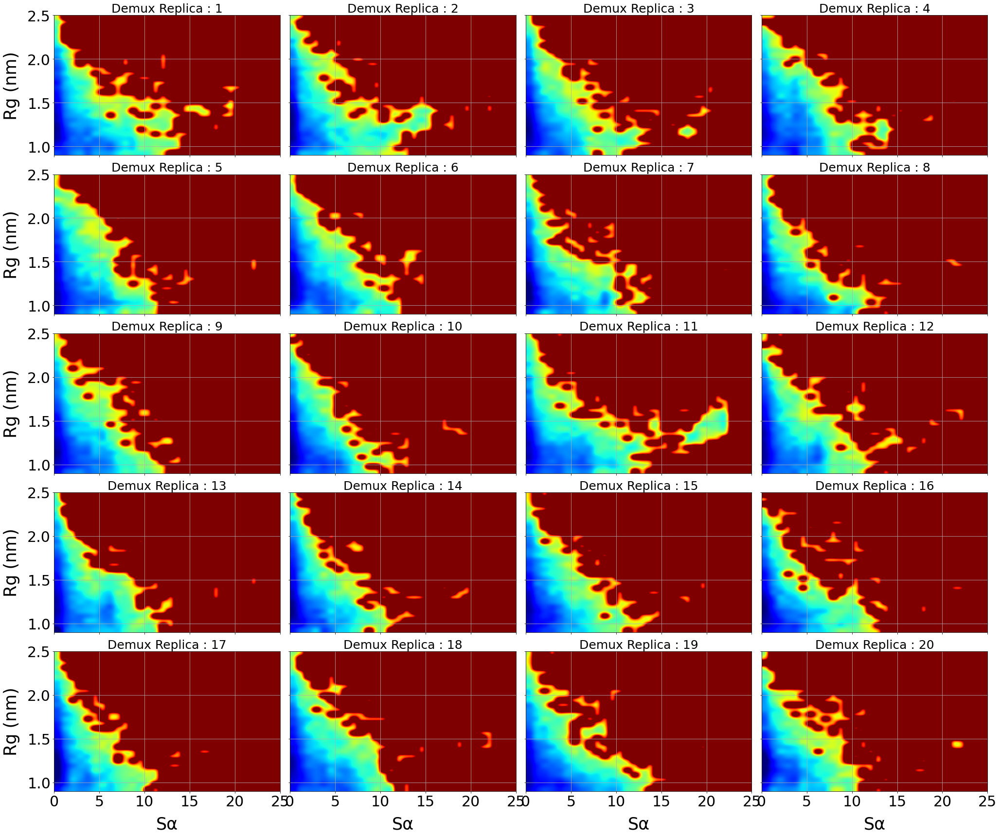

In [40]:
fig, ax = plt.subplots(5, 4, figsize=(28, 24), sharex=True, sharey=True)

i='demux'

#cbar_ax = fig.add_axes([.91, .3, .03, .4])

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    X=np.sum(np.array(sa[i])[val],axis=0)
    
    a, xedges, yedges = np.histogram2d(np.array(rg[i])[val], X, 30, [[0.9, 2.5], [0, 25.0]],
                                       normed=True, weights=None)
    
    a = np.log(np.flipud(a)+.000001)
    T = 300
    a = -(0.001987*T)*a
    

    im=subplot_imshow(a, xedges, yedges, ax=ax[p,q])
    
    
    cbar_ticks = [0, 1, 2, 3, 4, 5]
    #cb = plt.colorbar(ticks=cbar_ticks, format=('% .1f'),aspect=10,cax=cbar_ax,ax=ax[p,q])
    
    #subplot_imshow(a, xedges, yedges,ax=ax[p,q],cbar_ax=cbar_ax,cbar=cb)
    
    imaxes = plt.gca()
    
    ax[p,q].tick_params(labelsize=30)
    #plt.setp(ax[p,q].get_xticklabels())
    ax[p,q].grid()
    #ax[p,q].set_ylim(0.6,2.0)
    #ax[p,q].set_xticks(range(0,142,2))
    #ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
    ax[p,q].set_title('Demux Replica : ' + str(val + 1) ,size=25)

    if not q : ax[p,q].set_ylabel('Rg (nm)', size=35, labelpad=15)
    if p == 5-1 : ax[p,q].set_xlabel("Sα", size=35, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'sa_rg_rep.png',dpi=180)

In [ ]:
# fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

# i='rep'
# N=100

# for val in range(20):
#     p, q = np.unravel_index(val,(5, 4))
    
#     X=np.sum(np.array(pp[i])[val],axis=0)
    
#     ax[p,q].plot(time,X)
#     ax[p,q].plot(np.convolve(time, np.ones(N)/N, mode='valid'),
#                  np.convolve(X, np.ones(N)/N, mode='valid'),linewidth=2.5)
    
#     ax[p,q].tick_params(labelsize=25)
#     plt.setp(ax[p,q].get_xticklabels(), rotation=45)
#     #ax[p,q].set_ylim(0.6,2.0)
#     #ax[p,q].set_xticks(range(0,142,2))
#     #ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
#     ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

#     if not q : ax[p,q].set_ylabel("PP-II", size=30, labelpad=15)
#     if p == 2-1 : ax[p,q].set_xlabel('Time ($\mu$s)', size=30, labelpad=15)
        
# plt.tight_layout()

# plt.savefig(data_dir+'pp_rep.png',dpi=210)

In [ ]:
# fig, ax = plt.subplots(5, 4, figsize=(28, 24), sharex=True, sharey=True)

# i='rep'

# #cbar_ax = fig.add_axes([.91, .3, .03, .4])

# for val in range(20):
#     p, q = np.unravel_index(val,(5, 4))
    
#     X=np.sum(np.array(pp[i])[val],axis=0)
    
#     a, xedges, yedges = np.histogram2d(np.array(rg[i])[val], X, 30, [[0.6, 2.0], [0, 15.0]],
#                                        normed=True, weights=None)
    
#     a = np.log(np.flipud(a)+.000001)
#     T = 300
#     a = -(0.001987*T)*a
    

#     im=subplot_imshow(a, xedges, yedges, ax=ax[p,q])
    
    
#     cbar_ticks = [0, 1, 2, 3, 4, 5]
    
#     imaxes = plt.gca()
    
#     ax[p,q].tick_params(labelsize=30)
#     #plt.setp(ax[p,q].get_xticklabels())
#     ax[p,q].grid()
#     #ax[p,q].set_ylim(0.6,2.0)
#     #ax[p,q].set_xticks(range(0,142,2))
#     #ax[p,q].set_yticks(np.arange(0.6,2.2,0.4))
    
#     ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=25)

#     if not q : ax[p,q].set_ylabel('Rg (nm)', size=35, labelpad=15)
#     if p == 2-1 : ax[p,q].set_xlabel('PP-II', size=35, labelpad=15)
        
# plt.tight_layout()

# plt.savefig(data_dir+'pp_rg_rep.png',dpi=210)
# #plt.show()

In [ ]:
# aa=json.load(open(data_dir+'average_angle.json','r'))

In [ ]:
# for j in ['rep','demux']:

#     plt.figure(figsize=(8,6))
#     for i in range(0,20):

#         plt.scatter(np.array(aa[j]).T[0][i],np.array(aa[j]).T[1][i])
#         plt.arrow(np.array(aa[j]).T[0][i],
#                   (np.array(aa[j]).T[1][i]-(np.array(aa[j]).T[2][i]/2)),0,np.array(aa[j]).T[2][i])

#     plt.xticks(range(0,nrep),size=20,rotation=45)
#     plt.yticks(range(30,160,10),size=20)

#     plt.xlabel("Replica Number",size=24)
#     plt.ylabel("Average bend angle ($^{o}$)", size=24)
#     plt.grid(alpha=0.5)
#     plt.tight_layout()
    
#     if j=='rep' : plt.title('Temperature Replicas', size=20)
#     else : plt.title('Demuxed Replicas', size=20)
    
    
#     out_name='Average_angle_'+str(j)+'.png'
#     plt.savefig(data_dir+out_name,dpi=210)
    
#     plt.show()
#     plt.clf()

In [41]:
charge=json.load(open(data_dir+'charge_prob.json','r'))
hphob=json.load(open(data_dir+'hyphob_prob.json','r'))
aro=json.load(open(data_dir+'aro_prob.json','r'))
hbond=json.load(open(data_dir+'hbond_prob.json','r'))
contact=json.load(open(data_dir+'contact_prob.json','r'))

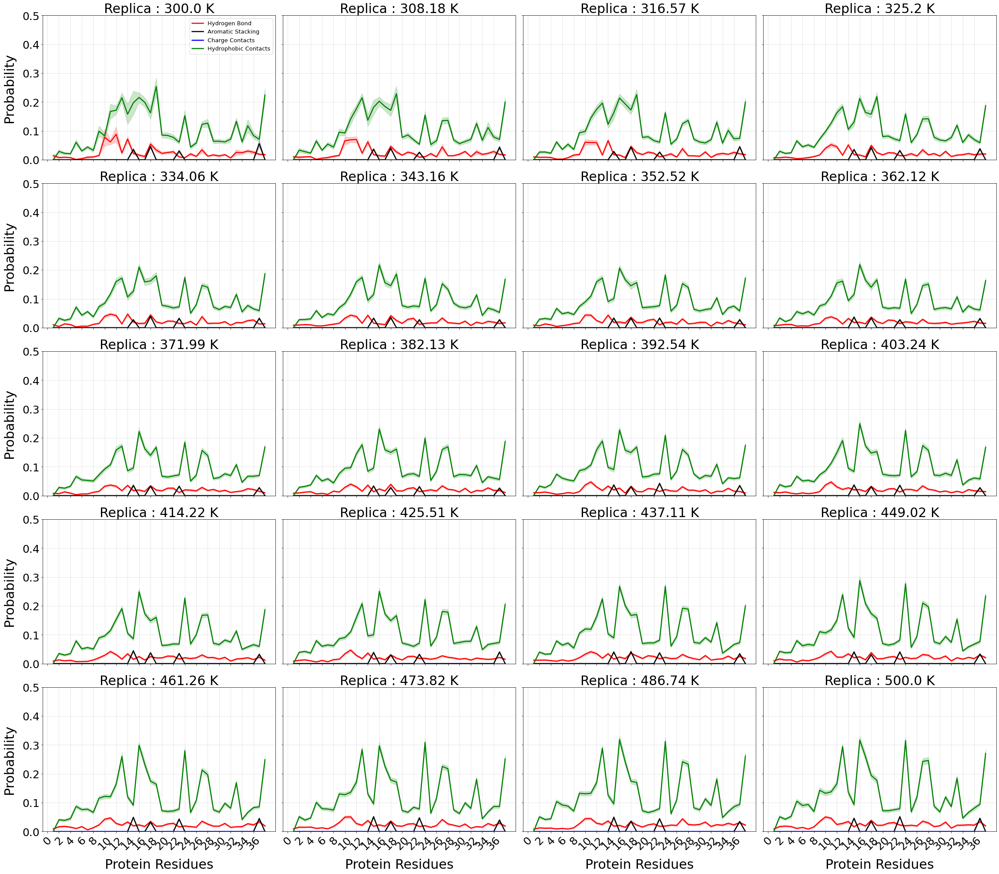

In [42]:
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

i,j=['rep','bf']

for val in range(20):
    p, q = np.unravel_index(val,(5, 4))
    
    ax[p, q].plot(np.array(hbond[i][j][val]).T[0], np.array(hbond[i][j][val]).T[1], linewidth=2.5,
                         label='Hydrogen Bond', color='red')
    ax[p, q].fill_between(np.array(hbond[i][j][val]).T[0], np.array(hbond[i][j][val]).T[1]-np.array(hbond[i][j][val]).T[2],
                             np.array(hbond[i][j][val]).T[1]+np.array(hbond[i][j][val]).T[2], alpha=0.2,color='r')
    
    
    ax[p, q].plot(np.array(aro[i][j][val]).T[0], np.array(aro[i][j][val]).T[1], linewidth=2.5,
                         color='black', label='Aromatic Stacking')
    ax[p, q].fill_between(np.array(aro[i][j][val]).T[0], np.array(aro[i][j][val]).T[1]-np.array(aro[i][j][val]).T[2],
                             np.array(aro[i][j][val]).T[1]+np.array(aro[i][j][val]).T[2], alpha=0.2,color='black')
    
    ax[p, q].plot(np.array(charge[i][j][val]).T[0], np.array(charge[i][j][val]).T[1], linewidth=2.5,
                         label='Charge Contacts',c='blue')
    ax[p, q].fill_between(np.array(charge[i][j][val]).T[0], np.array(charge[i][j][val]).T[1]-np.array(charge[i][j][val]).T[2],
                             np.array(charge[i][j][val]).T[1]+np.array(charge[i][j][val]).T[2], alpha=0.2,color='b')
    
    ax[p, q].plot(np.array(hphob[i][j][val]).T[0], np.array(hphob[i][j][val]).T[1], linewidth=2.5,
                         label='Hydrophobic Contacts', color='green')
    ax[p, q].fill_between(np.array(hphob[i][j][val]).T[0], np.array(hphob[i][j][val]).T[1]-np.array(hphob[i][j][val]).T[2],
                             np.array(hphob[i][j][val]).T[1]+np.array(hphob[i][j][val]).T[2], alpha=0.2,color='g')
    
    ax[p, q].set_ylim(0,0.5)
    ax[p, q].set_xticks(range(0,38,2))
    ax[p,q].tick_params(labelsize=25)
    ax[p,q].grid(alpha=0.4)
    ax[p,q].set_title('Replica : '+str(temperature[val])+' K',size=30)
    plt.setp(ax[p,q].get_xticklabels(), rotation=45)
    
    if val == 0:
        ax[p,q].legend(loc=1,prop={'size': 13})

    # a='Replica : '+str(temperature[val])+' $K$'
    # ax[p,q].set_title(a,size=28)
    
    # text_=r'$K_{D}$'+' : '+str(round(np.array(bf_kd['rep'])[2][val],2))+r'$\pm$'+str(round(np.array(bf_kd['rep'])[3][val],2))
    # ax[p,q].text(70.3, 0.43, text_, fontsize = 26)
    
    if not q : ax[p,q].set_ylabel("Probability", size=30, labelpad=15)
    if p == 5-1 : ax[p,q].set_xlabel('Protein Residues', size=30, labelpad=15)
        
plt.tight_layout()

plt.savefig(data_dir+'Ligand_interactions_rep.png',dpi=210)


In [43]:
# calculate round trip times stack
def calc_round_trip_stack(file, reps = 20 ):
    """
    xvg = the index xvg file with the exchanges at every 80ps
    """
    # unpack the xvg file 
    rep_dict = {} # for counting 
    xvg = np.loadtxt(file ,comments=["@", "#"])[:,1:]

    for i in range(reps): 
        rep = xvg[:,i]
        rep_dict[i] = 0 
        stack = []
        for e in rep:
            # reinstantiate list 
            if len(stack) == reps: 
                rep_dict[i] += 0.5
                stack = []
            elif int(e) not in stack: 
                stack.append(int(e))
    
    return rep_dict

In [44]:
rep_dict = calc_round_trip_stack("./replica_temp.xvg")

Text(0.5, 1.0, 'IAPP WT + inhibitor Roundtrips')

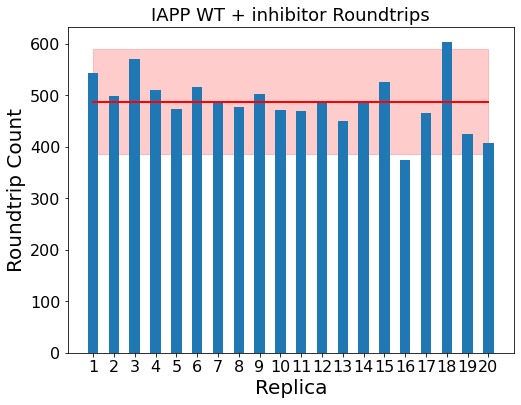

In [63]:
import matplotlib.pyplot as plt
plt.style.use(os.path.abspath('./presentation.mplstyle')) # has to be an absolute path 
plt.figure(figsize=(8,6))
heights = [float(i) for i in rep_dict.values()]
all_mean = np.mean(heights)
all_stdev = np.std(heights)
y = [int(all_mean)]*20
yerr = [int(2*all_stdev)]*20
x = np.arange(0,20)
plt.plot(x,y,"r")
plt.fill_between(x, np.array(y) + yerr, np.array(y) - yerr, alpha=0.2, color="r")
plt.bar(rep_dict.keys(), heights, width=0.5)
plt.xticks(np.arange(0,20),np.arange(1,21))
plt.xlabel("Replica", fontsize=20)
plt.ylabel("Roundtrip Count", fontsize=20)
plt.title("IAPP WT + inhibitor Roundtrips")

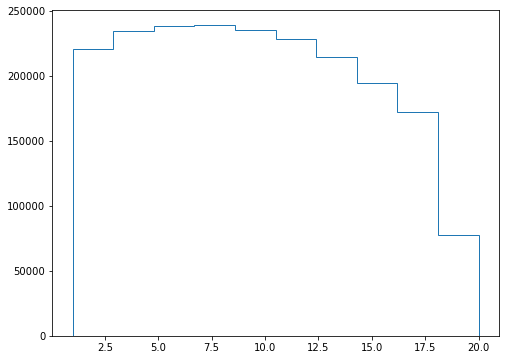

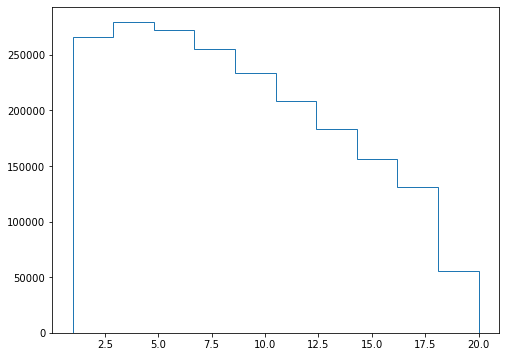

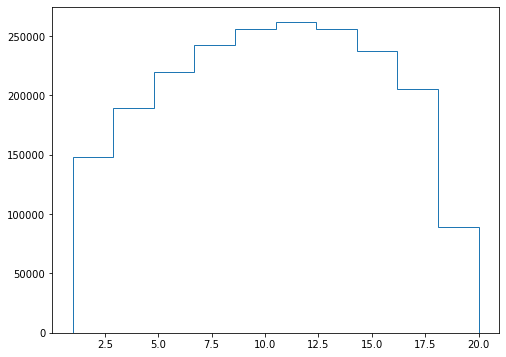

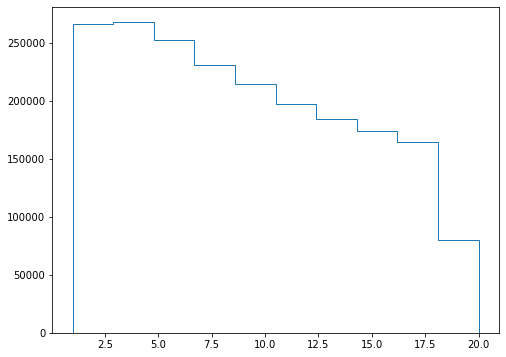

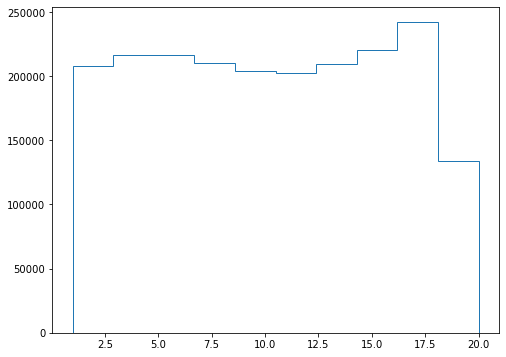

...

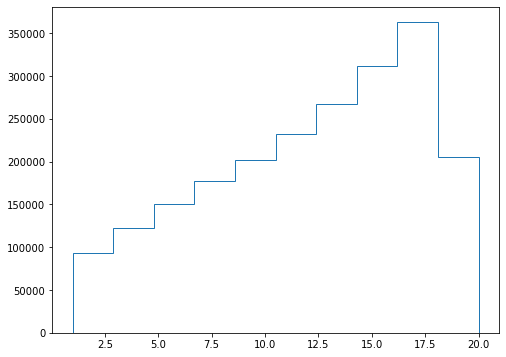

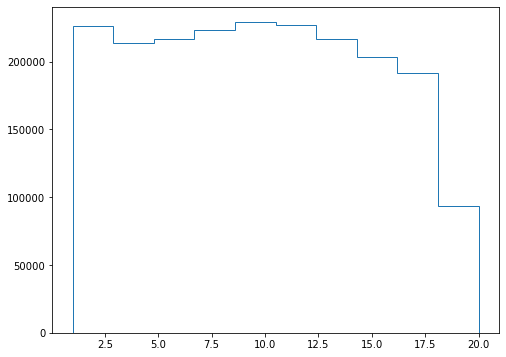

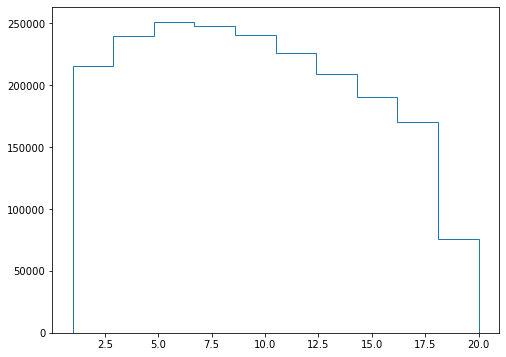

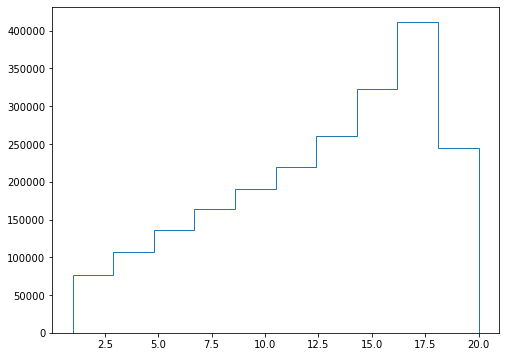

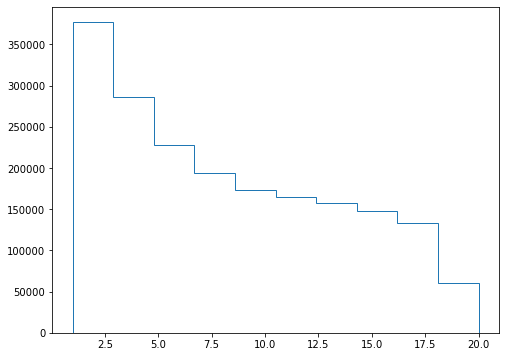

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


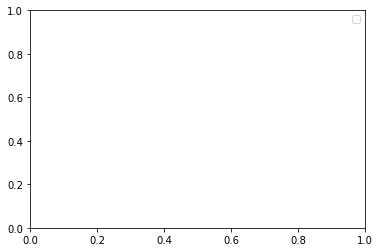

In [46]:
# load in the xvg file and create histograms 
file = "./replica_temp.xvg"
temp_xvg = np.loadtxt(file ,comments=["@", "#"])[:,1:]


for i in range(20): 
        plt.figure(figsize=(8,6))
        rep = temp_xvg[:,i]
        plt.hist(rep,range= (1,20),histtype= "step", label= str(temperature[i]) + " K ")
        plt.show()

plt.legend(loc = "upper right")

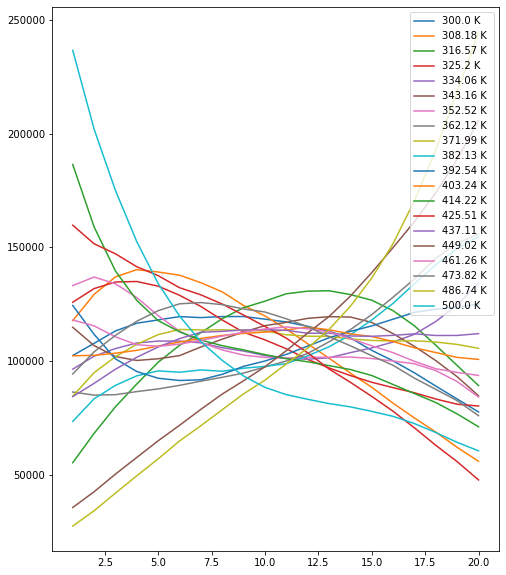

In [47]:
# load in the xvg file and create histograms 
file = "./replica_temp.xvg"
temp_xvg = np.loadtxt(file ,comments=["@", "#"])[:,1:]

plt.figure(figsize=(8,10))

for i in range(20):
        ls = [] 
        rep = temp_xvg[:,i]
        for j in range(20):
                count = np.sum(np.where(rep == j, 1, 0))
                ls.append(count)
        plt.plot(range(1,21), ls, label= str(temperature[i]) + " K ")

plt.legend(loc = "upper right")

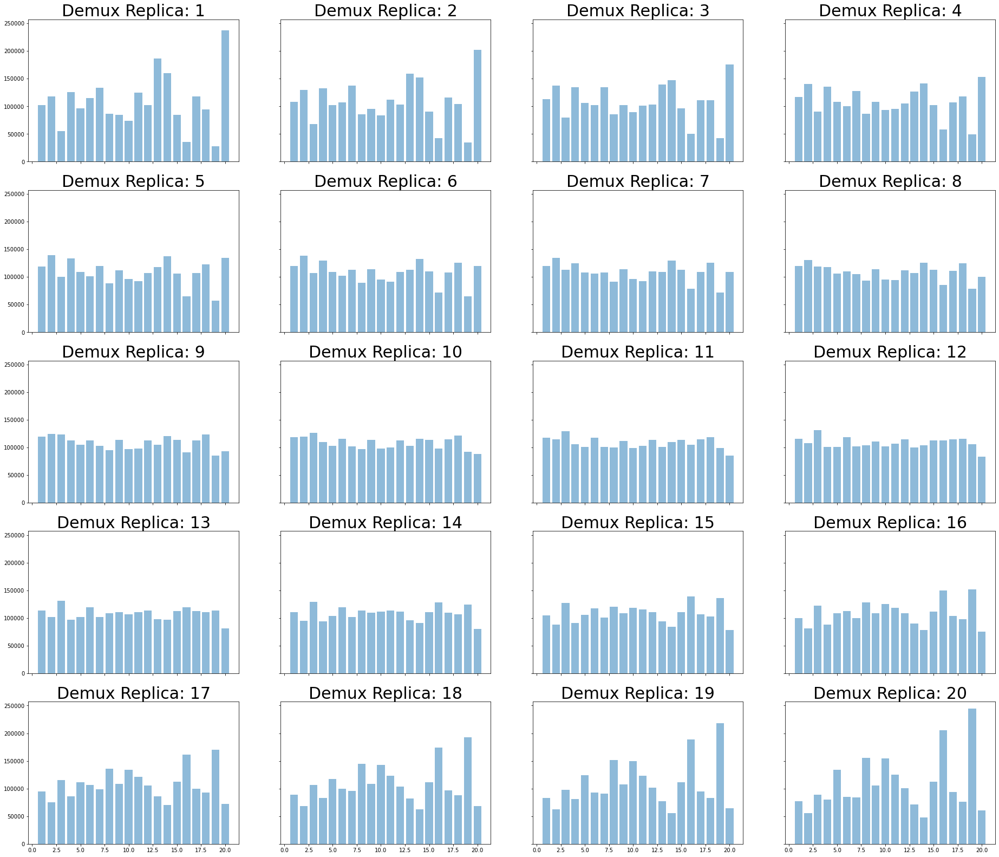

In [48]:
# load in the xvg file and create barplot of the count  
file = "./replica_temp.xvg"
temp_xvg = np.loadtxt(file ,comments=["@", "#"])[:,1:]

fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

total = []
for i in range(20):
        ls = [] 
        rep = temp_xvg[:,i]
        for j in range(20):
                count = np.sum(np.where(rep == j, 1, 0))
                ls.append(count)
        total.append(ls)
total = np.array(total)
for k in range(20): 
        p, q = np.unravel_index(k,(5, 4))
        ax[p, q].bar( np.arange(1,21) ,height = total[:,k], label= str(k), alpha = 0.5)
        ax[p,q].set_title('Demux Replica: ' + str(k+1),size=30)

plt.show()

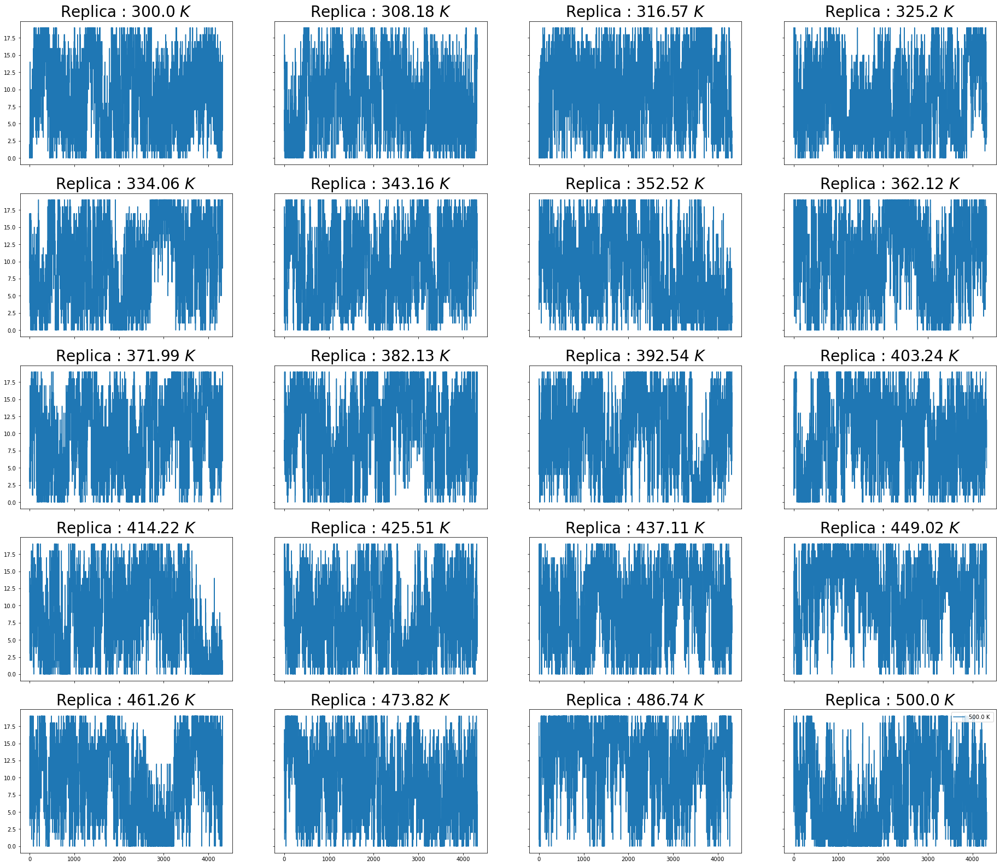

In [49]:
# 
fig, ax = plt.subplots(5, 4, figsize=(32, 28), sharex=True, sharey=True)

for val in range(20):
        p, q = np.unravel_index(val,(5, 4))
        rep = temp_xvg[:,val]
        ax[p, q].plot(rep[::500], label= str(temperature[i]) + " K ")
        a='Replica : '+str(temperature[val])+' $K$'
        ax[p,q].set_title(a,size=28)

plt.legend(loc = "upper right")